In [1]:
from __future__ import division, unicode_literals, print_function  # for compatibility with Python 2 and 3

from collections import defaultdict
import PIL
from sklearn.cluster import KMeans
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.special import factorial
from scipy.stats import poisson
from itertools import chain
from scipy.special import i0




from tqdm import tqdm
import scipy.cluster.hierarchy as hcluster
from scipy import ndimage
# change the following to %matplotlib notebook for interactive plotting
%matplotlib notebook
from scipy.signal import find_peaks
# Optionally, tweak styles.
mpl.rc('figure',  figsize=(10, 5))
mpl.rc('image', cmap='gray')
import numpy as np
import pandas as pd
from pandas import DataFrame, Series  # for convenience
import cv2
import pims
import trackpy as tp

## import images


def minimum_close_values(lst, threshold):
    result = []
    current_group = [lst[0]]
    
    for i in range(1, len(lst)):
        if lst[i] - lst[i-1] <= threshold:
            current_group.append(lst[i])
        else:
            minimum = min(current_group)
            result.append(minimum)
            current_group = [lst[i]]
    
    minimum = min(current_group)
    result.append(minimum)
    
    return result


def filter_elements(A, B, threshold):
    filtered_list = []
    for element_A in A:
        for element_B in B:
            if abs(element_A - element_B) <= threshold:
                filtered_list.append(element_A)
                break  # Break out of the inner loop once a match is found
    return filtered_list
def count_ones(matrix):
    count = 0
    tot=0
    for row in matrix:
        for element in row:
            tot+=1
            if element == 1:
                count += 1
    return (count/tot)*100



def subtract_with_previous(lst):
    result = []
    for i in range(1, len(lst)):
        diff = np.abs(lst[i] - lst[i - 1])
        result.append(diff)
    return result

def find_deviation(file):
    @pims.pipeline
    def gray(image):
        return image[:, :, 1]  # Take just the green channel

    frames = pims.open(file)
    first_frame = frames[1]
    blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
    threshold = 20  # Set desired threshold value

    binary_img = np.where(blurred_frame > threshold, 1,0)
    
  
    Area_initial = count_ones(binary_img)
    center_of_mass_initial = ndimage.measurements.center_of_mass(binary_img)
    Area_store=[]
    av_vec_store=[]
    r_cm_store=[]
    var_vector_store=[]
    cm_coordinates_x=[]
    cm_coordinates_y=[]
    for n in range(0,100):
        first_frame = frames[n]
        blurred_frame = cv2.GaussianBlur(first_frame, (1, 1),100)  # Applying Gaussian blur with kernel size (5, 5)
        threshold = 20  # Set desired threshold value

        binary_img = np.where(blurred_frame > threshold, 1,0)
        Area = count_ones(binary_img)
        Area_store.append(Area)
        
        %matplotlib notebook
        # Load the binary image
        image = binary_img
        image = cv2.convertScaleAbs(image)
        center_of_mass = ndimage.measurements.center_of_mass(binary_img)
        
        cm_coordinates_x.append(center_of_mass[0])
        cm_coordinates_y.append(center_of_mass[1])
        r_cm_store.append(np.sqrt(center_of_mass[0]**2+center_of_mass[1]**2))
        
        # Apply Canny edge detection
        edges = cv2.Canny(image, 0, 1)  # Adjust the thresholds as needed
       
        # Convert edge image to binary format
        edges = edges.astype(np.uint8)

        # Find contours of the edges
        contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Combine all edge coordinates into a single list
        edge_coordinates = []
        for contour in contours:
            contour_coordinates = []
            for point in contour:
                x, y = point[0]
                contour_coordinates.append((x, y))
            edge_coordinates.extend(contour_coordinates)

        # Convert edge_coordinates to a NumPy array
        edge_coordinates = np.array(edge_coordinates)
        coordinates = edge_coordinates
        coordinates = np.array(coordinates)

        # Calculate radial distance from the origin
        distances=[]
        for pos in edge_coordinates:
            r=np.sqrt((pos[0]-center_of_mass_initial[0])**2+(pos[1]-center_of_mass_initial[1])**2)
            distances.append(r)
        av_dist_time=np.mean(distances)
        
        # Print the radial distances
        #print(np.mean(distances))
        av_vec_store.append(np.mean(distances))
        var_time=[]
        for r in distances:
            var_time.append(np.abs(r-av_dist_time))
        
        var_vector_store.append(np.mean(var_time))
    
    difference = subtract_with_previous(av_vec_store)
    area_change= subtract_with_previous(Area_store)
    
    variance_change=subtract_with_previous(var_vector_store)
    cm_coord_change_x=subtract_with_previous(cm_coordinates_x)
    cm_coord_change_y=subtract_with_previous(cm_coordinates_y)
    ##r_cm_change= subtract_with_previous(r_cm_store)
    r_cm_change= [i**2+j**2 for i,j in zip(cm_coord_change_x,cm_coord_change_x)]
    Area_initial=1
    normalised_difference=[i/Area_initial for i in difference ]
    normalised_area_change=[i/Area_initial for i in  area_change]
    normalised_r_cm_change=[i/Area_initial for i in  r_cm_change]
    normalised_variance_change=[i/Area_initial for i in  variance_change]
    
    return normalised_difference,normalised_area_change,normalised_r_cm_change,normalised_variance_change

def boundary_tracking(file):
    m_p=1
    Fps=1
    @pims.pipeline
    def gray(image):
        return image[:, :, 1]  # Take just the green channel

    frames = pims.open(file)
    first_frame = frames[0]

    blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
    threshold = 20  # Set desired threshold value

    binary_img = np.where(blurred_frame > threshold, 1,0)

    #center_of_mass = ndimage.measurements.center_of_mass(binary_img)
    surface_store=[]
    rmin_frame=[]
    angle_max=[]
    time=[]
    
    for n in range(0,len(frames)):
        time.append(n)
        first_frame = frames[n]
        blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
        threshold = 20  # Set desired threshold value

        binary_img = np.where(blurred_frame > threshold, 1,0)
        center_of_mass = ndimage.measurements.center_of_mass(binary_img)
        
        %matplotlib notebook
        # Load the binary image
        image = binary_img
        image = cv2.convertScaleAbs(image)
        
        
        
        # Apply Canny edge detection
        edges = cv2.Canny(image, 0, 1)  # Adjust the thresholds as needed
        
        # Convert edge image to binary format
        edges = edges.astype(np.uint8)
    
        # Find contours of the edges
        contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Combine all edge coordinates into a single list
        edge_coordinates = []
        for contour in contours:
            contour_coordinates = []
            for point in contour:
                x, y = point[0]
                contour_coordinates.append((x, y))
            edge_coordinates.extend(contour_coordinates)

        # Convert edge_coordinates to a NumPy array
        edge_coordinates = np.array(edge_coordinates)
        angle_to_fix=np.linspace(0,360,25)
        edge_coordinates_fixed=[]
        angle=[]
        r_time=[]
        
        for pos in edge_coordinates:
            x, y = pos
            rmin_frame.append(np.sqrt((x-center_of_mass[1])**2+(y-center_of_mass[0])**2))
            r_time.append(np.sqrt((x-center_of_mass[1])**2+(y-center_of_mass[0])**2))
            
            theta=abs(np.arctan((y-center_of_mass[0])/(x-center_of_mass[1]))*57.2958)
            dx=(x-center_of_mass[1])
            dy=(y-center_of_mass[0])
        
            if dx>0 and dy>0:
                new_angle=theta
                angle.append(new_angle)
            if dx<0 and dy>0:
                new_angle=180-theta
                angle.append(new_angle)
            if dx<0 and dy<0:
                new_angle=180+theta
                angle.append(new_angle)
            if dx>0 and dy<0:
                new_angle=360-theta
                angle.append(new_angle)
        
            for ang in angle_to_fix:
                if abs(new_angle-ang)<2:
                    edge_coordinates_fixed.append([x,y])

            #####################################################################
       
        r_max=np.max(r_time)
        ind_max=r_time.index(r_max)
        angle_of_max_r=angle[ind_max]
        angle_max.append(angle_of_max_r)
        for pos in edge_coordinates_fixed:
            x, y = pos
            first_frame[y, x] =  first_frame[y, x] = 255  # Increase brightness by 50, capped at 255
        surface_store.append(first_frame)
    
  
    
    f = tp.batch(surface_store,11,minmass=255);
    t = tp.link(f,5, memory=8)

    t1 = tp.filter_stubs(t,40)
    ## subtract any drift in image(look at image from the center of mass)
    d = tp.compute_drift(t1)
    tm = tp.subtract_drift(t1.copy(), d) 
    tm.rename(columns = {'size':'area'}, inplace = True)
    data = pd.DataFrame()
    
    for item in set(tm.particle):
    
        sub = tm[tm.particle==item]
    
        dx = m_p*np.diff(sub.x)/1. # differnece between to frame for X postion
        dy = m_p*np.diff(sub.y)/1. #wdiffernece between to frame for Y postion
        dt = np.diff(sub.frame)/Fps #to calcul the time
        dr=((np.sqrt(dy**2 + dx**2)))
        tan = (dy/dx) # to calcul the slope
        ang_d=abs((np.arctan(tan)*57.2958))
        #print(np.diff(sub.frame))
        v = (((np.sqrt(dy**2 + dx**2)))/dt) # to calcul the velocity  12 microns per pixel
        
        for x, y, dx, dy,disp, v,ang_disp,area, dt, frame in zip(sub.x[:-1], sub.y[:-1], abs(dx), abs(dy),dr ,v,ang_d,sub.area[:-1] ,dt,sub.frame[:-1],):
            data = data.append([{'dx': dx,
            'dy': dy,
             'x': x,
             'y': y,
            'frame': frame,
             'particle': item,
              'disp':disp,                  
             'dt' : dt,
             'area':area,
              'ang_disp':ang_disp,                   
             'v' : v}])
       
    
    
    utraj = np.unique(tm.particle)
    num_traj = utraj.size
    cdict = {}
    return tm,data,center_of_mass[1],center_of_mass[0],np.mean(rmin_frame),angle_max,time
def find_ee_distance(data):  ## takes in dataframe and a max lag time
    disp_part_i=[]
    xi=[]
    yi=[]
    part_id=[]
    ## see all particle numbers that have trajectory 
    part_temp=list(data['particle'])
    part = list(set(part_temp))
    for i in part: ## loop over all trajectories
        del_t=[]
        msd_part_i=[]
        df=data.loc[data['particle'] ==i]  ## dataframe of all rows with particle =i
        x_list=list(df['x'])## x positions of particle i
        y_list=list(df['y'])## y positions of particle i
        dx=(x_list[0]-x_list[-1])
        dy=(y_list[0]-y_list[-1])
        disp=np.sqrt(dx**2+dy**2) ## find displacement
        disp_part_i.append(disp)
        xi.append(x_list[-1])
        yi.append(y_list[-1])
        part_id.append(i)
    return xi,yi,part_id    
def find_rad_distance(data,xc,yc):  ## takes in dataframe and a max lag time
    disp_part_i=[]
    ri_list=[]
    rf_list=[]
    part_id=[]
    ## see all particle numbers that have trajectory 
    part_temp=list(data['particle'])
    part = list(set(part_temp))
    for i in part: ## loop over all trajectories
        del_t=[]
        msd_part_i=[]
        df=data.loc[data['particle'] ==i]  ## dataframe of all rows with particle =i
        x_list=list(df['x'])## x positions of particle i
        y_list=list(df['y'])## y positions of particle i
        dxi=(x_list[0]-xc)
        dyi=(y_list[0]-yc)
        dxf=(x_list[-1]-xc)
        dyf=(y_list[-1]-yc)  
        ri=np.sqrt(dxi**2+dyi**2) ## find displacement
        rf=np.sqrt(dxf**2+dyf**2) ## find displacement
        ri_list.append(ri)
        rf_list.append(rf)
        part_id.append(i)
    return ri_list,rf_list,part_id

def in_out(ri,rf,xe,ye,iidr,data,plot,rmin,file):
    frames = pims.open(file)
    first_frame = frames[0]
    blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
    threshold = 20  # Set desired threshold value

    binary_img = np.where(blurred_frame > threshold, 1,0)
    
  
    Area_initial = count_ones(binary_img)
    %matplotlib notebook
    iid_in=[]
    iid_out=[]
    ee_distance=[]
    V_filtered_list=[]
    out_x_coords=[]
    out_y_coords=[]
    out_t_coords=[]
    for i in range(0,len(ri)):
        
        if ri[i]>rf[i] and ri[i]<=rmin :
          
            df=data.loc[data['particle'] ==iidr[i]]
            trajx_out=df['x'].tolist()
            trajy_out=df['y'].tolist()
            t_list_out=df['frame'].tolist
            dx=( trajx[0]- trajx[-1])
            dy=( trajy[0]- trajy[-1])
            disp=np.sqrt(dx**2+dy**2) ## find displacement
            ee_distance.append(disp/ Area_initial )
            out_x_coords.append(trajx)
            out_y_coords.append(trajy)
            out_t_coords.append(t)
            v_list=df['v'].tolist()
            
            for j in (v_list):
                V_filtered_list.append(j)
            if plot==1:
                plt.scatter(xe[i],ye[i],color='yellow',s=10)
                plt.plot(trajx,trajy,color='brown')
            iid_in.append(i)
          
        if ri[i]<rf[i] and ri[i]<=rmin : 
        
            df=data.loc[data['particle'] ==iidr[i]]
            trajx=df['x'].tolist()
            trajy=df['y'].tolist()
            
            dx=( trajx[0]- trajx[-1])
            dy=( trajy[0]- trajy[-1])
            disp=np.sqrt(dx**2+dy**2) ## find displacement
            ee_distance.append(disp/ Area_initial )
            v_list=df['v'].tolist()
            if plot==1:
                plt.scatter(xe[i],ye[i],color='yellow',s=10)
                plt.plot(trajx,trajy,color='brown')
            for j in (v_list):
                V_filtered_list.append(j)
           
            iid_out.append(i)
           
         #plt.ylim(max(ye), min(ye))

    if plot==1:
        plt.imshow(frames[0]);
    plt.show()
    return V_filtered_list,ee_distance
    
def smooth_list(lst, window_size):
    smoothed = []
    for i in range(len(lst)):
        window_start = max(0, i - window_size + 1)
        window_end = i + 1
        window_values = lst[window_start:window_end]
        window_average = sum(window_values) / len(window_values)
        smoothed.append(window_average)
    return smoothed


#def average_lists_by_label(A, B):
#    grouped_lists = defaultdict(list)
#    
#    for sublist, label in zip(A, B):
#        grouped_lists[label].append(sublist)
    
#    averaged_lists = {}
#    for label, sublists in grouped_lists.items():
#        averaged_lists[label] = [sum(elements) / len(elements) for elements in zip(*sublists)]
    
 #   return averaged_lists

def average_lists_by_label(A, B):
    grouped_lists = defaultdict(list)

    for sublist, label in zip(A, B):
        grouped_lists[label].append(sublist)

    averaged_lists = {}
    variances= {}
    for label, sublists in grouped_lists.items():
        averaged_lists[label] = [np.mean(elements) for elements in zip(*sublists)]
        variances[label] = [np.var(elements) for elements in zip(*sublists)]
        

    return  averaged_lists,variances


%matplotlib notebook
def find_traj_data(frames,conect,mem,size,mass,filt):
    ## locate features in all frames( fluroscent bleach after 200 frames)
    f = tp.batch(frames[:200],size, minmass=mass); ### locate features with radius 7 and minimum brightness 100 from frame 100

    ## link different frames
    t = tp.link(f,conect, memory=mem) ### features must uptot 5 pixels in the next frame to be considered a trajectory (memory incase it disapears for some frames)

    #### trajectories that last fewer than 30 frames are disguarded
    t1 = tp.filter_stubs(t,filt)
    # Compare the number of particles in the unfiltered and filtered data.
    #print('Before:', t['particle'].nunique())
    #print('After:', t1['particle'].nunique())

     #tp.plot_traj(t1);

    ## subtract any drift in image(look at image from the center of mass)
    d = tp.compute_drift(t1)
    tm = tp.subtract_drift(t1.copy(), d) 
    tm.rename(columns = {'size':'area'}, inplace = True)
    data = pd.DataFrame()

    for item in set(tm.particle):
    
        sub = tm[tm.particle==item]
    
        dx = m_p*np.diff(sub.x)/1. # differnece between to frame for X postion
        dy = m_p*np.diff(sub.y)/1. #wdiffernece between to frame for Y postion
        dt = np.diff(sub.frame)/Fps #to calcul the time
        dr=((np.sqrt(dy**2 + dx**2)))
        tan = (dy/dx) # to calcul the slope
        ang_d=abs((np.arctan(tan)*57.2958))
        #print(np.diff(sub.frame))
        v = (((np.sqrt(dy**2 + dx**2)))/dt) # to calcul the velocity  12 microns per pixel
        for x, y, dx, dy,disp, v,ang_disp,area, dt, frame in zip(sub.x[:-1], sub.y[:-1], abs(dx), abs(dy),dr ,v,ang_d,sub.area[:-1] ,dt,sub.frame[:-1],):
            data = data.append([{'dx': dx,
            'dy': dy,
             'x': x,
             'y': y,
            'frame': frame,
             'particle': item,
              'disp':disp,                  
             'dt' : dt,
             'area':area,
              'ang_disp':ang_disp,                   
             'v' : v,}])
       
    
    
    utraj = np.unique(tm.particle)
    num_traj = utraj.size
    cdict = {}

   
    return tm,data




def find_ee_distance2(data):  ## takes in dataframe and a max lag time
    disp_part_i=[]
    xi=[]
    yi=[]
    part_id=[]
    ## see all particle numbers that have trajectory 
    part_temp=list(data['particle'])
    part = list(set(part_temp))
    for i in part: ## loop over all trajectories
        del_t=[]
        msd_part_i=[]
        df=data.loc[data['particle'] ==i]  ## dataframe of all rows with particle =i
        x_list=list(df['x'])## x positions of particle i
        y_list=list(df['y'])## y positions of particle i
        dx=(x_list[0]-x_list[-1])
        dy=(y_list[0]-y_list[-1])
        disp=np.sqrt(dx**2+dy**2) ## find displacement
        disp_part_i.append(disp)
        xi.append(x_list[-1])
        yi.append(y_list[-1])
        part_id.append(i)
    return disp_part_i,xi,yi,part_id

def find_rad_distance2(data,xc,yc):  ## takes in dataframe and a max lag time
    disp_part_i=[]
    ri_list=[]
    rf_list=[]
    part_id=[]
    ## see all particle numbers that have trajectory 
    part_temp=list(data['particle'])
    part = list(set(part_temp))
    for i in part: ## loop over all trajectories
        del_t=[]
        msd_part_i=[]
        df=data.loc[data['particle'] ==i]  ## dataframe of all rows with particle =i
        x_list=list(df['x'])## x positions of particle i
        y_list=list(df['y'])## y positions of particle i
        dxi=(x_list[0]-xc)
        dyi=(y_list[0]-yc)
        dxf=(x_list[-1]-xc)
        dyf=(y_list[-1]-yc)  
        ri=np.sqrt(dxi**2+dyi**2) ## find displacement
        rf=np.sqrt(dxf**2+dyf**2) ## find displacement
        ri_list.append(ri)
        rf_list.append(rf)
        part_id.append(i)
    return ri_list,rf_list,part_id
def find_cm(frames,tm,size):
    ##finding center of cell, is taking center of mass ok? how to define the center from image?
    f = tp.batch(frames[:200],size, minmass=100); ### locate features with radius 7 and minimum brightness 100 from frame 100
    x_vals=f['x'].tolist()
    y_vals=f['y'].tolist()
    mass=f['raw_mass'].tolist()
    x_cm=0
    y_cm=0
    for i in range(0,len(mass)):## takin
        x_cm+=(x_vals[i]*mass[i])/np.sum(mass)
        y_cm+=(y_vals[i]*mass[i])/np.sum(mass)
    
     
    return x_cm,y_cm
def in_out2(min_dist,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax):
    iid_in=[]
    iid_out=[]
    %matplotlib notebook
    V_filtered_list=[]
    out_x_coords=[]
    out_y_coords=[]
    out_t_coords=[]
    for ind,i in enumerate(iidr):
        
        if ee[ind]>min_dist and ri[ind]>rmin and ri[ind]<rmax :
            #plt.scatter(xe[i],ye[i],color='yellow',s=10)
            df=data.loc[data['particle'] ==i]
            trajx=df['x'].tolist()
            trajy=df['y'].tolist()
            t_list=df['frame'].tolist()
            x=trajx
            y=trajy
            
            out_x_coords.append(trajx)
            out_y_coords.append(trajy)
            out_t_coords.append(t_list)
            c_map = plt.cm.get_cmap('coolwarm')

            # Normalize the color values between 0 and 1
            norm = plt.Normalize(0, len(x) - 1)
            
            
            # Plot the trajectories with a colormap
            for i in range(len(x) - 1):
                color = c_map(norm(i))
                plt.plot([x[i], x[i+1]], [y[i], y[i+1]], color=color)


            # Add a colorbar to show the fade in between
            sm = plt.cm.ScalarMappable(cmap=c_map, norm=norm)
            sm.set_array([])
            #cbar = plt.colorbar(sm)


            #plt.xlabel('X')
            #plt.ylabel('Y')
            #plt.title('Particle Trajectories')
       
            for i in range(0,len(iidr)):
        
                if ri[i]>rf[i] and ee[i]>min_dist and ri[i]>rmin and ri[i]<rmax:
                    iid_in.append(i)
                
          
                if ri[i]<rf[i] and ee[i]>min_dist and ri[i]>rmin and ri[i]<rmax:
                
                    iid_out.append(i)

    return out_x_coords,out_y_coords, out_t_coords
ratio=[]
vel_list=[]
label=[]

/tmp/ipykernel_58362/3028204272.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


<IPython.core.display.Javascript object>


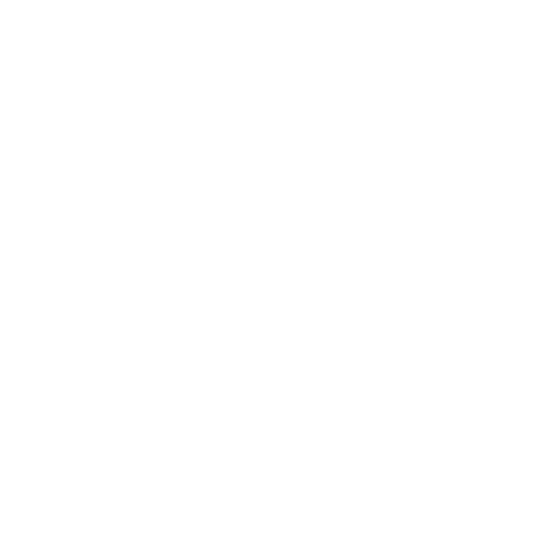

len 1193


In [2]:
import matplotlib.pyplot as plt
from skimage import io, color, feature
frames = pims.open('mouse_actin1/*.jpg')


import cv2
first_frame = frames[1]
# Load the image

image = first_frame

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

blurred_frame = cv2.GaussianBlur(first_frame, (9, 9),100)  # Applying Gaussian blur with kernel size (5, 5)
binary_img = np.where(blurred_frame > 20, 1,0)
center_of_mass = ndimage.measurements.center_of_mass(binary_img)
# Detect edges using Canny edge detection
edges = feature.canny(blurred_frame ,low_threshold=5, high_threshold=20)
edge_coords = []
rows, cols = edges.shape
threshold = 20  # Radial distance threshold

for row in range(rows):
    for col in range(cols):
        if edges[row, col]:
            # Calculate the radial distance between the edge coordinate and the center
            radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
            # Exclude points with radial distance less than the threshold
            if radial_distance >= threshold:
                edge_coords.append((col, row))  # Append (x, y) coordinates
# Plot the original image with the edges overlay`
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image)
#ax.imshow(edges, alpha=0.3)
ax.axis('off')

# Plot the edge coordinates as a scatter plot
edge_coords = np.array(edge_coords)
ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='#4dff4d', s=0.5)
print('len',len(edge_coords))
plt.show()

/tmp/ipykernel_58362/1316491230.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


<IPython.core.display.Javascript object>


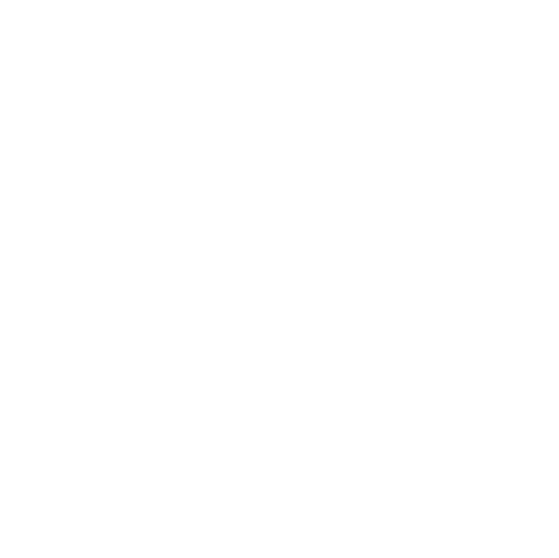

len 1343


In [3]:
import matplotlib.pyplot as plt
from skimage import io, color, feature
frames = pims.open('mouse_actin1/*.jpg')


import cv2
first_frame = frames[1]
# Load the image

image = first_frame

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
binary_img = np.where(blurred_frame > 20, 1,0)
center_of_mass = ndimage.measurements.center_of_mass(binary_img)
# Detect edges using Canny edge detection
edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=40)
edge_coords = []
rows, cols = edges.shape
threshold = 20  # Radial distance threshold

for row in range(rows):
    for col in range(cols):
        if edges[row, col]:
            # Calculate the radial distance between the edge coordinate and the center
            radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
            # Exclude points with radial distance less than the threshold
            if radial_distance >= threshold:
                edge_coords.append((col, row))  # Append (x, y) coordinates
# Plot the original image with the edges overlay`
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image)
#ax.imshow(edges, alpha=0.3)
ax.axis('off')

# Plot the edge coordinates as a scatter plot
edge_coords = np.array(edge_coords)
ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='#4dff4d', s=0.5)
print('len',len(edge_coords))
plt.show()

In [5]:


@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel
m_p=1
Fps=1
frames = pims.open('mouse_actin1/*.jpg')
label.append('WT')
conect=4
mem=5
size=7
mass=100
filt=9
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
#rmin=40
#rmax=100
rmin=30
rmax=70
tm,data=find_traj_data(frames,conect,mem,size,mass,filt)
ee,xe,ye,iid=find_ee_distance2(data)
x_cm,y_cm=find_cm(frames,tm,size)

print(x_cm,y_cm)
c=4
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance2(data,x_cm,y_cm)
x,y,t=in_out2(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)
plt.imshow(frames[0])
plt.show()


frames = pims.open('mouse_actin1/*.jpg')
display= pims.open('mouse_tcr1/*.jpg')
error_threshold = 0.5
corelation=0
tot_coord=0
print(len(frames))
edge_store_x=[]
edge_store_y=[]
x_store=[]
y_store=[]
t_display=60
for f in range(200):
    
   
            
            
    # Plot the actin density from the current frame
    first_frame = frames[f]
    display_loop=display[f]
    ax.cla()
    frame_curr = first_frame/255
    ax.imshow(frame_curr,origin='lower',cmap="Greys_r",vmin=0,vmax=1)
    # Load the image

    image = first_frame

    # Convert the image to grayscale
    gray_image = color.rgb2gray(image)

    blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
    binary_img = np.where(blurred_frame > threshold, 1,0)
    center_of_mass = ndimage.measurements.center_of_mass(binary_img)
    # Detect edges using Canny edge detection
    edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=40)
    edge_coords = []
    rows, cols = edges.shape
    threshold = 25  # Radial distance threshold

    for row in range(rows):
        for col in range(cols):
            if edges[row, col]:
                # Calculate the radial distance between the edge coordinate and the center
                radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
                # Exclude points with radial distance less than the threshold
                if radial_distance >= threshold:
                    edge_coords.append((col, row))  # Append (x, y) coordinates
                    
    
    #Plot the original image with the edges overlay
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(display_loop)
    ax.imshow(edges, alpha=0.3) 
    ax.axis('off')

    # Plot the edge coordinates as a scatter plot
    edge_coords = np.array(edge_coords)
    ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='#4dff4d', s=0.1)
    
    for i,t_particle_i in enumerate(t):
        for j,ti in enumerate(t_particle_i):
            if ti==f:   ## check if particle frame is the same
              #  print(x[i][j],edge_coords[:, 0])
                
                tot_coord += 1
                #print(xi,edge_coords[:, 0])
                # Check if xi is within error_threshold of any value in edge_coords[:, 0]
                xi_within_range = any(abs(x[i][j] - edge_x) <= error_threshold for edge_x in edge_coords[:, 0])
                yi_within_range = any(abs(y[i][j] - edge_y) <= error_threshold for edge_y in edge_coords[:, 1])
                if ti==t_display:
                    x_store.append(x[i][j])
                    y_store.append(y[i][j])
                #print(xi_within_range)
                if xi_within_range==True and yi_within_range==True:
                    corelation += 1
    print(corelation/tot_coord)             
    ax.set_title("Frame no %03d"%f)
    plt.savefig("wt_2/frame_%03d.png"%f,bbox_inches="tight")
print(corelation/tot_coord)

figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()
ratio.append(corelation/tot_coord)

Frame 199: 61 features
278.95022936959043 206.2102172881919
278.95022936959043 206.2102172881919


<IPython.core.display.Javascript object>

900


/tmp/ipykernel_58362/895060655.py:65: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


<IPython.core.display.Javascript object>

0.9473684210526315


<IPython.core.display.Javascript object>

0.9459459459459459


<IPython.core.display.Javascript object>

0.9444444444444444


<IPython.core.display.Javascript object>

0.9552238805970149


<IPython.core.display.Javascript object>

0.9655172413793104


<IPython.core.display.Javascript object>

0.9714285714285714


<IPython.core.display.Javascript object>

0.975609756097561


<IPython.core.display.Javascript object>

0.9788732394366197


<IPython.core.display.Javascript object>

0.9813664596273292


<IPython.core.display.Javascript object>

0.9672131147540983


<IPython.core.display.Javascript object>

0.9653465346534653


<IPython.core.display.Javascript object>

0.963963963963964


<IPython.core.display.Javascript object>

0.9670781893004116


<IPython.core.display.Javascript object>

0.9695817490494296


<IPython.core.display.Javascript object>

0.9716312056737588


<IPython.core.display.Javascript object>

0.9736842105263158


<IPython.core.display.Javascript object>

0.9753846153846154


<IPython.core.display.Javascript object>

0.9767441860465116


<IPython.core.display.Javascript object>

0.9756756756756757


/tmp/ipykernel_58362/895060655.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(8, 8))


<IPython.core.display.Javascript object>

0.9746835443037974


<IPython.core.display.Javascript object>

0.9761336515513126


<IPython.core.display.Javascript object>

0.9773755656108597


<IPython.core.display.Javascript object>

0.9786324786324786


<IPython.core.display.Javascript object>

0.9796747967479674


<IPython.core.display.Javascript object>

0.9806576402321083


<IPython.core.display.Javascript object>

0.9814814814814815


<IPython.core.display.Javascript object>

0.982174688057041


<IPython.core.display.Javascript object>

0.9812286689419796


<IPython.core.display.Javascript object>

0.9820261437908496


<IPython.core.display.Javascript object>

0.9795275590551181


<IPython.core.display.Javascript object>

0.9803030303030303


<IPython.core.display.Javascript object>

0.9809663250366032


<IPython.core.display.Javascript object>

0.981638418079096


<IPython.core.display.Javascript object>

0.9823609226594301


<IPython.core.display.Javascript object>

0.9830065359477124


<IPython.core.display.Javascript object>

0.9835858585858586


<IPython.core.display.Javascript object>

0.9829268292682927


<IPython.core.display.Javascript object>

0.9823113207547169


<IPython.core.display.Javascript object>

0.9817351598173516


<IPython.core.display.Javascript object>

0.9823204419889503


<IPython.core.display.Javascript object>

0.9828326180257511


<IPython.core.display.Javascript object>

0.9833506763787722


<IPython.core.display.Javascript object>

0.9838383838383838


<IPython.core.display.Javascript object>

0.984313725490196


<IPython.core.display.Javascript object>

0.9846596356663471


<IPython.core.display.Javascript object>

0.9850885368126747


<IPython.core.display.Javascript object>

0.985494106980961


<IPython.core.display.Javascript object>

0.9858407079646018


<IPython.core.display.Javascript object>

0.9862187769164513


<IPython.core.display.Javascript object>

0.9865884325230512


<IPython.core.display.Javascript object>

0.9869174161896974


<IPython.core.display.Javascript object>

0.9872611464968153


<IPython.core.display.Javascript object>

0.9875872769588828


<IPython.core.display.Javascript object>

0.9878511769172361


<IPython.core.display.Javascript object>

0.9873511904761905


<IPython.core.display.Javascript object>

0.9861212563915267


<IPython.core.display.Javascript object>

0.9849462365591398


<IPython.core.display.Javascript object>

0.9852216748768473


<IPython.core.display.Javascript object>

0.9855072463768116


<IPython.core.display.Javascript object>

0.9858012170385395


<IPython.core.display.Javascript object>

0.9860186418109188


<IPython.core.display.Javascript object>

0.9862655330281229


<IPython.core.display.Javascript object>

0.9864690721649485


<IPython.core.display.Javascript object>

0.9866751269035533


<IPython.core.display.Javascript object>

0.9868995633187773


<IPython.core.display.Javascript object>

0.9870928088506453


<IPython.core.display.Javascript object>

0.9872881355932204


<IPython.core.display.Javascript object>

0.9874851013110846


<IPython.core.display.Javascript object>

0.9876977152899824


<IPython.core.display.Javascript object>

0.9873125720876585


<IPython.core.display.Javascript object>

0.9875070982396366


<IPython.core.display.Javascript object>

0.9876473891072431


<IPython.core.display.Javascript object>

0.9878318584070797


<IPython.core.display.Javascript object>

0.9874863982589771


<IPython.core.display.Javascript object>

0.9871451526513123


<IPython.core.display.Javascript object>

0.9873484449130205


<IPython.core.display.Javascript object>

0.9875518672199171


<IPython.core.display.Javascript object>

0.9877363311190598


<IPython.core.display.Javascript object>

0.9869281045751634


<IPython.core.display.Javascript object>

0.9871350816427511


<IPython.core.display.Javascript object>

0.9872984855886663


<IPython.core.display.Javascript object>

0.9860442733397498


<IPython.core.display.Javascript object>

0.9852941176470589


<IPython.core.display.Javascript object>

0.985520784680056


<IPython.core.display.Javascript object>

0.985734008283479


<IPython.core.display.Javascript object>

0.9859218891916439


<IPython.core.display.Javascript object>

0.9860799281544679


<IPython.core.display.Javascript object>

0.985809312638581


<IPython.core.display.Javascript object>

0.9859649122807017


<IPython.core.display.Javascript object>

0.9856957087126138


<IPython.core.display.Javascript object>

0.9849914236706689


<IPython.core.display.Javascript object>

0.9847263470513364


<IPython.core.display.Javascript object>

0.984047019311503


<IPython.core.display.Javascript object>

0.9838308457711443


<IPython.core.display.Javascript object>

0.9840425531914894


<IPython.core.display.Javascript object>

0.9834075273168758


<IPython.core.display.Javascript object>

0.9835868694955965


<IPython.core.display.Javascript object>

0.9837495045580658


<IPython.core.display.Javascript object>

0.9838582677165354


<IPython.core.display.Javascript object>

0.9839968774395004


<IPython.core.display.Javascript object>

0.9841208365608056


<IPython.core.display.Javascript object>

0.9842428900845503


<IPython.core.display.Javascript object>

0.9843511450381679


<IPython.core.display.Javascript object>

0.9841029523088569


<IPython.core.display.Javascript object>

0.9842045881910493


<IPython.core.display.Javascript object>

0.9843283582089553


<IPython.core.display.Javascript object>

0.9844559585492227


<IPython.core.display.Javascript object>

0.9845588235294118


<IPython.core.display.Javascript object>

0.9846994535519126


<IPython.core.display.Javascript object>

0.9848211058908565


<IPython.core.display.Javascript object>

0.9849570200573066


<IPython.core.display.Javascript object>

0.9851063829787234


<IPython.core.display.Javascript object>

0.985252808988764


<IPython.core.display.Javascript object>

0.9853862212943633


<IPython.core.display.Javascript object>

0.9855222337125129


<IPython.core.display.Javascript object>

0.985655737704918


<IPython.core.display.Javascript object>

0.985781990521327


<IPython.core.display.Javascript object>

0.985910768198591


<IPython.core.display.Javascript object>

0.9860279441117764


<IPython.core.display.Javascript object>

0.9861294583883752


<IPython.core.display.Javascript object>

0.9862475442043221


<IPython.core.display.Javascript object>

0.9863724853990915


<IPython.core.display.Javascript object>

0.9864995178399228


<IPython.core.display.Javascript object>

0.9865985960433951


<IPython.core.display.Javascript object>

0.9867088607594937


<IPython.core.display.Javascript object>

0.9868090452261307


<IPython.core.display.Javascript object>

0.98688729316266


<IPython.core.display.Javascript object>

0.9869686627365808


<IPython.core.display.Javascript object>

0.987037037037037


<IPython.core.display.Javascript object>

0.9871165644171779


<IPython.core.display.Javascript object>

0.9871951219512195


<IPython.core.display.Javascript object>

0.9872611464968153


<IPython.core.display.Javascript object>

0.9873341375150784


<IPython.core.display.Javascript object>

0.9874138447707522


<IPython.core.display.Javascript object>

0.9874888293118856


<IPython.core.display.Javascript object>

0.9875592417061612


<IPython.core.display.Javascript object>

0.9876288659793815


<IPython.core.display.Javascript object>

0.9877085162423178


<IPython.core.display.Javascript object>

0.987794245858762


<IPython.core.display.Javascript object>

0.9878752886836027


<IPython.core.display.Javascript object>

0.987948350071736


<IPython.core.display.Javascript object>

0.9880239520958084


<IPython.core.display.Javascript object>

0.9881019830028328


<IPython.core.display.Javascript object>

0.9881690140845071


<IPython.core.display.Javascript object>

0.9882352941176471


<IPython.core.display.Javascript object>

0.9882975759264419


<IPython.core.display.Javascript object>

0.9883656509695291


<IPython.core.display.Javascript object>

0.9884393063583815


<IPython.core.display.Javascript object>

0.9885088919288646


<IPython.core.display.Javascript object>

0.9885807504078303


<IPython.core.display.Javascript object>

0.9886517157524993


<IPython.core.display.Javascript object>

0.9887187751813054


<IPython.core.display.Javascript object>

0.9887790542345712


<IPython.core.display.Javascript object>

0.9888268156424581


<IPython.core.display.Javascript object>

0.9888741721854305


<IPython.core.display.Javascript object>

0.9889240506329114


<IPython.core.display.Javascript object>

0.988985051140834


<IPython.core.display.Javascript object>

0.9890425254369946


<IPython.core.display.Javascript object>

0.9890937418852246


<IPython.core.display.Javascript object>

0.9891528925619835


<IPython.core.display.Javascript object>

0.9892058596761758


<IPython.core.display.Javascript object>

0.9892583120204603


<IPython.core.display.Javascript object>

0.9893102570628659


<IPython.core.display.Javascript object>

0.9893482120213036


<IPython.core.display.Javascript object>

0.9893832153690597


<IPython.core.display.Javascript object>

0.9894313034725717


<IPython.core.display.Javascript object>

0.9894815927873779


<IPython.core.display.Javascript object>

0.9895261845386534


<IPython.core.display.Javascript object>

0.9895678092399404


<IPython.core.display.Javascript object>

0.9896142433234422


<IPython.core.display.Javascript object>

0.9896526237989652


<IPython.core.display.Javascript object>

0.9897008337420304


<IPython.core.display.Javascript object>

0.9897360703812317


<IPython.core.display.Javascript object>

0.989778534923339


<IPython.core.display.Javascript object>

0.9898329702251271


<IPython.core.display.Javascript object>

0.9898746383799422


<IPython.core.display.Javascript object>

0.9899232245681382


<IPython.core.display.Javascript object>

0.9899737407495822


<IPython.core.display.Javascript object>

0.9900213827512473


<IPython.core.display.Javascript object>

0.9900685741310002


<IPython.core.display.Javascript object>

0.9901129943502824


<IPython.core.display.Javascript object>

0.9901639344262295


<IPython.core.display.Javascript object>

0.9902166317260657


<IPython.core.display.Javascript object>

0.990271021542738


<IPython.core.display.Javascript object>

0.9903181189488244


<IPython.core.display.Javascript object>

0.9903758020164987


<IPython.core.display.Javascript object>

0.990426259402781


<IPython.core.display.Javascript object>

0.9904761904761905


<IPython.core.display.Javascript object>

0.9905256034288292


<IPython.core.display.Javascript object>

0.9905702739110912


<IPython.core.display.Javascript object>

0.9906229068988613


<IPython.core.display.Javascript object>

0.9906708129720124


<IPython.core.display.Javascript object>

0.9907161803713528


<IPython.core.display.Javascript object>

0.990763140532219


<IPython.core.display.Javascript object>

0.9907995618838993


<IPython.core.display.Javascript object>

0.9908436886854153


<IPython.core.display.Javascript object>

0.9908913467794405


<IPython.core.display.Javascript object>

0.9909248055315472


<IPython.core.display.Javascript object>

0.9909677419354839


<IPython.core.display.Javascript object>

0.9909677419354839
0.9909677419354839


<IPython.core.display.Javascript object>

In [5]:
print('done')

done


/tmp/ipykernel_13836/3443994098.py:16: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


<IPython.core.display.Javascript object>


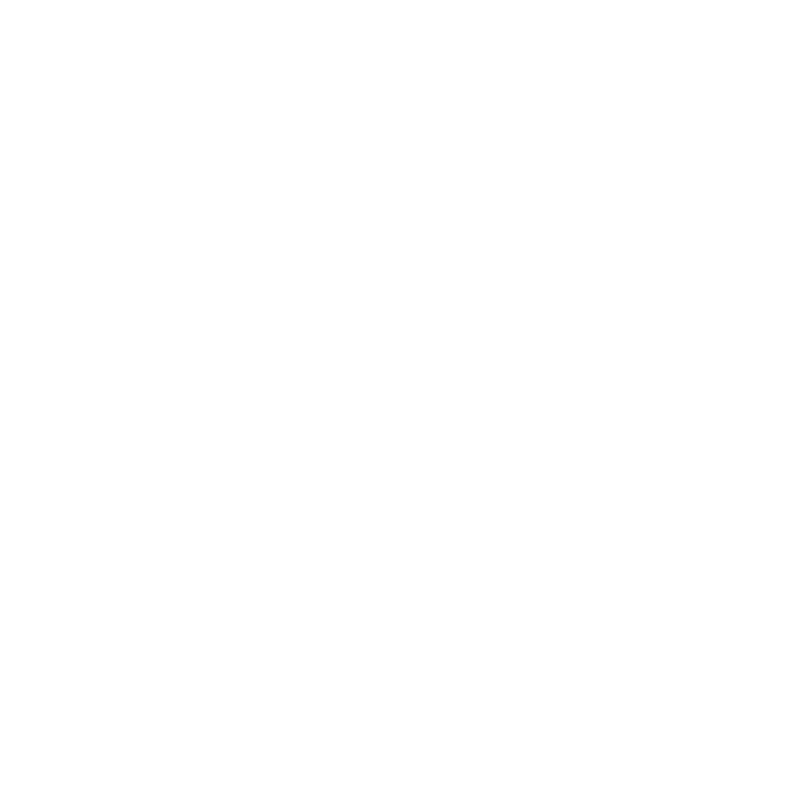

len 1619


In [6]:
import matplotlib.pyplot as plt
from skimage import io, color, feature
import matplotlib.cbook as cbook
from matplotlib_scalebar.scalebar import ScaleBar

frames = pims.open('mouse_actin1/*.jpg')

display=pims.open('mouse_actin1/*.jpg')
import cv2
first_frame = frames[t_display]
# Load the image
display_img=display[t_display]
image = first_frame

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
binary_img = np.where(blurred_frame > 20, 1,0)
center_of_mass = ndimage.measurements.center_of_mass(binary_img)
# Detect edges using Canny edge detection
edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=30)
edge_coords = []
rows, cols = edges.shape
threshold = 20  # Radial distance threshold

for row in range(rows):
    for col in range(cols):
        if edges[row, col]:
            # Calculate the radial distance between the edge coordinate and the center
            radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
            # Exclude points with radial distance less than the threshold
            if radial_distance >= threshold:
                edge_coords.append((col, row))  # Append (x, y) coordinates
# Plot the original image with the edges overlay`
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(display_img)
#ax.imshow(edges, alpha=0.3)
ax.axis('off')

# Plot the edge coordinates as a scatter plot
edge_coords = np.array(edge_coords)
ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='#4dff4d', s=1)

print('len',len(edge_coords))
plt.show()
plt.scatter(x_store,y_store,facecolors='r', edgecolors='r',s=20)

#edge_sore_x=edge_coords[:, 0]
#edge_sore_y=edge_coords[:, 1]
#TCR_store_x=x_store
#TCR_store_y=y_store

# Create scale bar
scalebar = ScaleBar(41.7, "nm", scale_loc='bottom', length_fraction=0.25, color='white', box_alpha=0)


ax.add_artist(scalebar)

In [7]:
print(corelation/tot_coord)

0.7938408896492729


/tmp/ipykernel_13836/1287262643.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


<IPython.core.display.Javascript object>


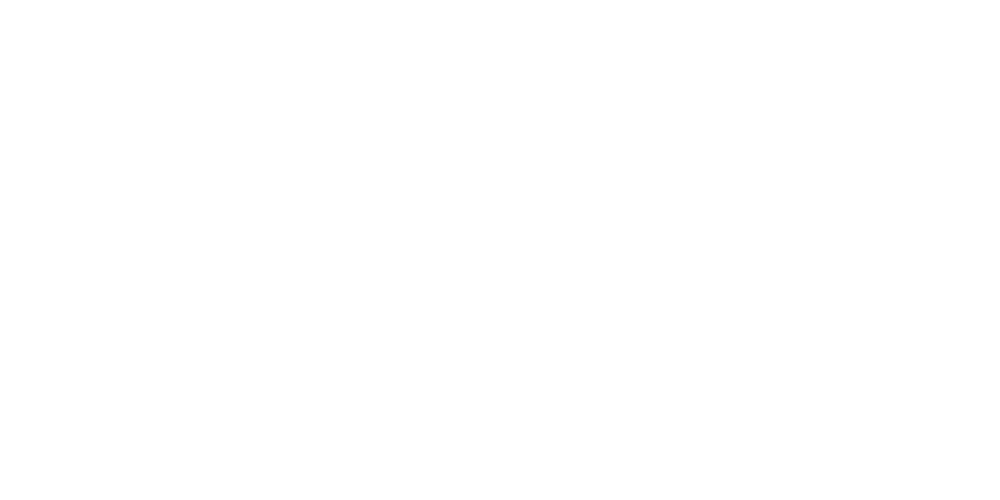

<IPython.core.display.Javascript object>


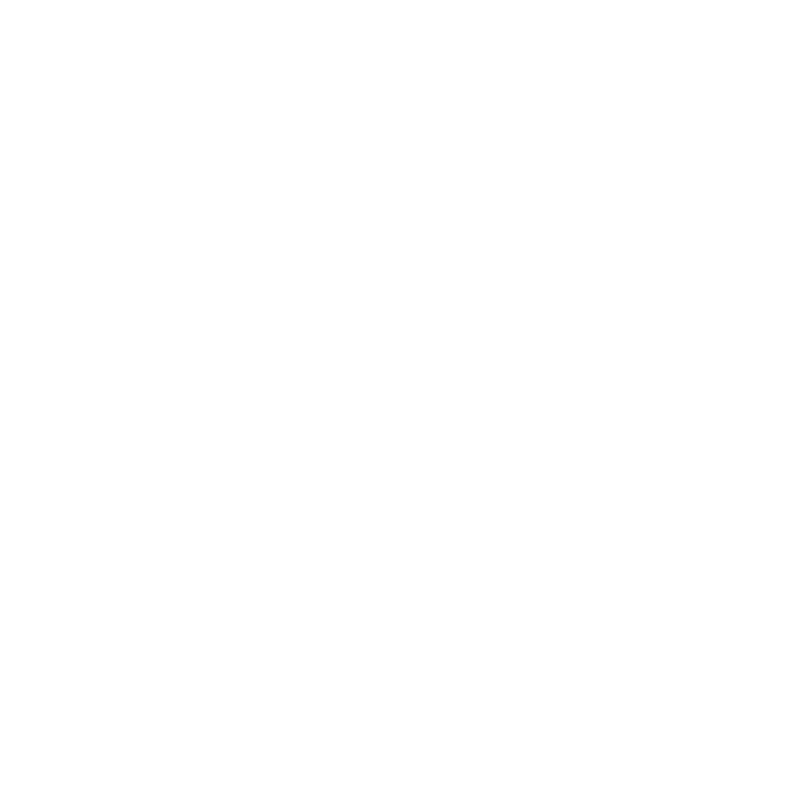

len 761


In [8]:
import matplotlib.pyplot as plt
from skimage import io, color, feature
frames = pims.open('mouse_actin2/*.jpg')
%matplotlib notebook

import cv2
first_frame = frames[0]
# Load the image

image = first_frame

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

blurred_frame = cv2.GaussianBlur(first_frame, (5,5),100)  # Applying Gaussian blur with kernel size (5, 5)
plt.imshow(blurred_frame)
binary_img = np.where(blurred_frame > 10, 1,0)
center_of_mass = ndimage.measurements.center_of_mass(binary_img)
# Detect edges using Canny edge detection
edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=50)
edge_coords = []
rows, cols = edges.shape
threshold = 20  # Radial distance threshold

for row in range(rows):
    for col in range(cols):
        if edges[row, col]:
            # Calculate the radial distance between the edge coordinate and the center
            radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
            # Exclude points with radial distance less than the threshold
            if radial_distance >= threshold:
                edge_coords.append((col, row))  # Append (x, y) coordinates
# Plot the original image with the edges overlay`
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image)
#ax.imshow(edges, alpha=0.3)
ax.axis('off')

# Plot the edge coordinates as a scatter plot
edge_coords = np.array(edge_coords)
ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='blue', s=0.5)
print('len',len(edge_coords))
plt.show()

Frame 199: 20 features
280 252
280 252


<IPython.core.display.Javascript object>


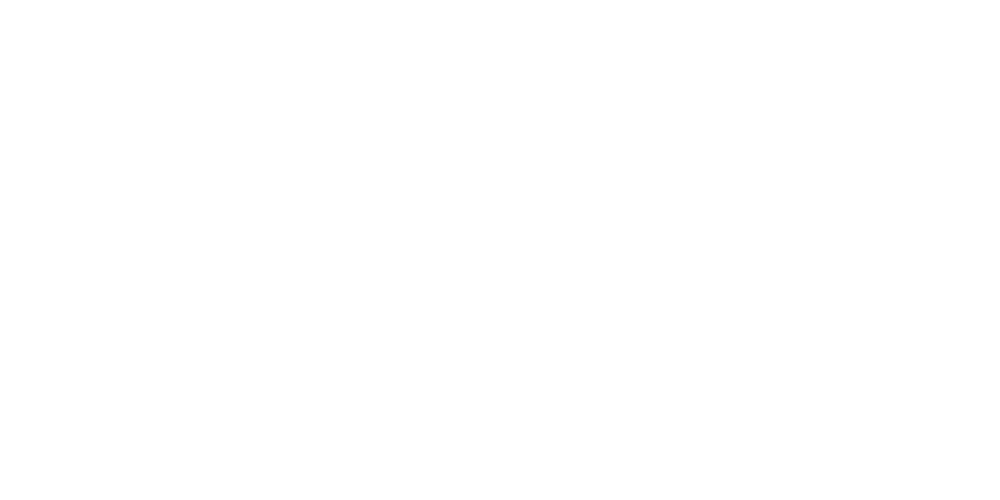

900


/tmp/ipykernel_13836/484044099.py:65: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


0.7140845070422536


<IPython.core.display.Javascript object>


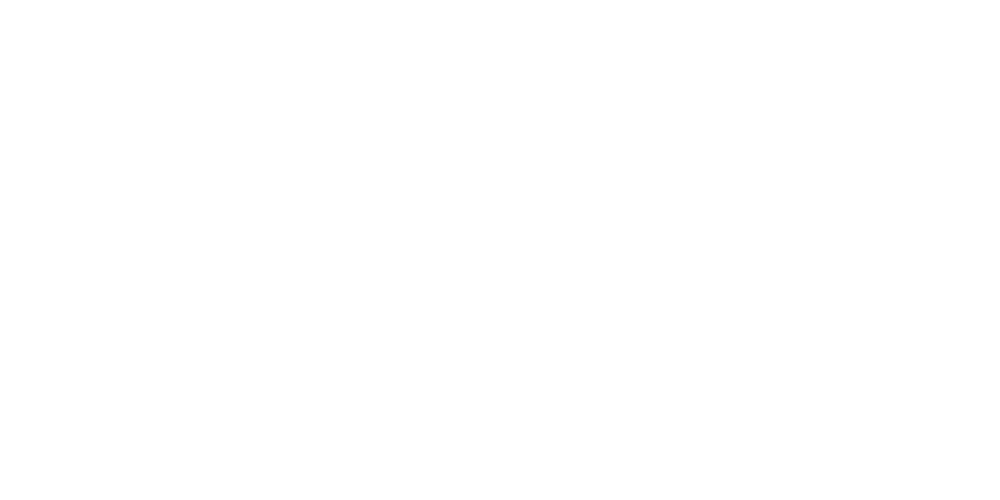

In [9]:
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel
m_p=1
Fps=1
frames = pims.open('mouse_tcr2/*.jpg')
label.append('WT')
conect=4
mem=5
size=9
mass=40
filt=9
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
#rmin=40
#rmax=100
rmin=20
rmax=60
tm,data=find_traj_data(frames,conect,mem,size,mass,filt)
ee,xe,ye,iid=find_ee_distance2(data)
x_cm,y_cm=find_cm(frames,tm,size)
x_cm=280
y_cm=252
print(x_cm,y_cm)
c=4
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance2(data,x_cm,y_cm)
x,y,t=in_out2(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)
plt.imshow(frames[0])
plt.show()


frames = pims.open('mouse_actin2/*.jpg')
display= pims.open('mouse_tcr2/*.jpg')
error_threshold = 0.5
corelation=0
tot_coord=0
print(len(frames))
edge_store_x=[]
edge_store_y=[]
x_store=[]
y_store=[]
for f in range(100):
    
   
            
            
    # Plot the actin density from the current frame
    first_frame = frames[f]
    display_loop=display[f]
    ax.cla()
    frame_curr = first_frame/255
    ax.imshow(frame_curr,origin='lower',cmap="Greys_r",vmin=0,vmax=1)
    # Load the image

    image = first_frame

    # Convert the image to grayscale
    gray_image = color.rgb2gray(image)

    blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
    binary_img = np.where(blurred_frame > threshold, 1,0)
    center_of_mass = ndimage.measurements.center_of_mass(binary_img)
    # Detect edges using Canny edge detection
    edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=40)
    edge_coords = []
    rows, cols = edges.shape
    threshold = 20  # Radial distance threshold

    for row in range(rows):
        for col in range(cols):
            if edges[row, col]:
                # Calculate the radial distance between the edge coordinate and the center
                radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
                # Exclude points with radial distance less than the threshold
                if radial_distance >= threshold:
                    edge_coords.append((col, row))  # Append (x, y) coordinates
                    
    
    # Plot the original image with the edges overlay
    #fig, ax = plt.subplots(figsize=(8, 8))
    #ax.imshow(display_loop)
   # ax.imshow(edges, alpha=0.3) 
    ax.axis('off')

    # Plot the edge coordinates as a scatter plot
    edge_coords = np.array(edge_coords)
    ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='blue', s=0.5)
    for x_edge in edge_coords[:, 0]:
        edge_store_x.append(x_edge)
        
    for y_edge in edge_coords[:, 1]:
        edge_store_y.append(y_edge)
    for i,t_particle_i in enumerate(t):
        for j,ti in enumerate(t_particle_i):
            if ti==f:   ## check if particle frame is the same
              #  print(x[i][j],edge_coords[:, 0])
                x_store.append(x[i][j])
                y_store.append(y[i][j])
                tot_coord += 1
                #print(xi,edge_coords[:, 0])
                # Check if xi is within error_threshold of any value in edge_coords[:, 0]
                xi_within_range = any(abs(x[i][j] - edge_x) <= error_threshold for edge_x in edge_coords[:, 0])
                yi_within_range = any(abs(y[i][j] - edge_y) <= error_threshold for edge_y in edge_coords[:, 1])
                #print(xi_within_range)
                if xi_within_range==True and yi_within_range==True:
                    corelation += 1
    #print(corelation/tot_coord)             
   # ax.set_title("Frame no %03d"%f)
    #plt.savefig("wt_1/frame_%03d.png"%f,bbox_inches="tight")
print(corelation/tot_coord)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()
ratio.append(corelation/tot_coord)

/tmp/ipykernel_13836/1561350200.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


<IPython.core.display.Javascript object>


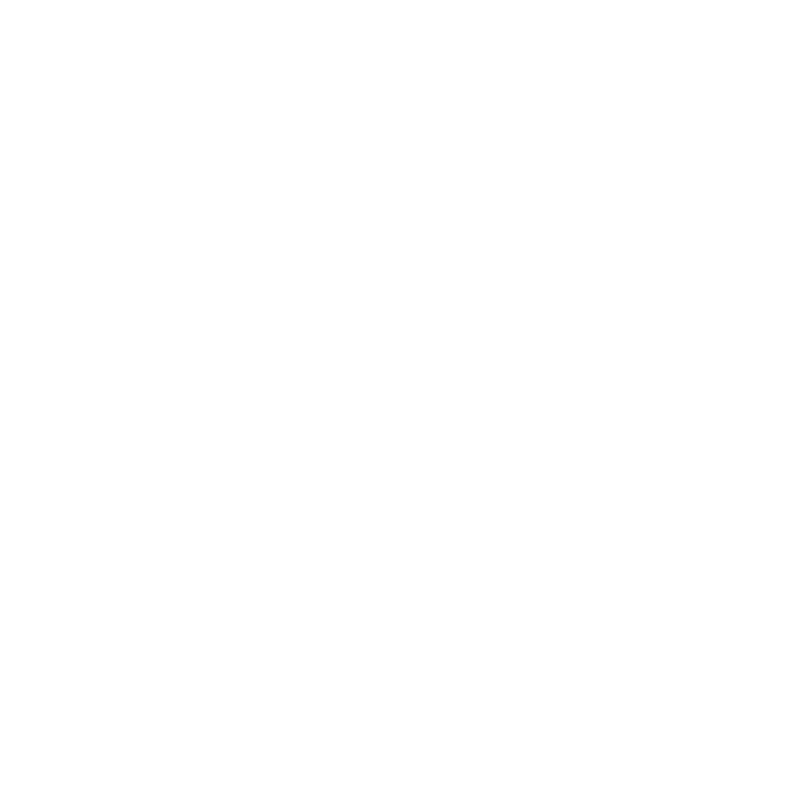

len 1628


In [10]:
import matplotlib.pyplot as plt
from skimage import io, color, feature
frames = pims.open('mouse_actin3/*.jpg')


import cv2
first_frame = frames[1]
# Load the image

image = first_frame

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
binary_img = np.where(blurred_frame > 20, 1,0)
center_of_mass = ndimage.measurements.center_of_mass(binary_img)
# Detect edges using Canny edge detection
edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=30)
edge_coords = []
rows, cols = edges.shape
threshold = 20  # Radial distance threshold

for row in range(rows):
    for col in range(cols):
        if edges[row, col]:
            # Calculate the radial distance between the edge coordinate and the center
            radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
            # Exclude points with radial distance less than the threshold
            if radial_distance >= threshold:
                edge_coords.append((col, row))  # Append (x, y) coordinates
# Plot the original image with the edges overlay`
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image)
#ax.imshow(edges, alpha=0.3)
ax.axis('off')

# Plot the edge coordinates as a scatter plot
edge_coords = np.array(edge_coords)
ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='blue', s=0.5)
print('len',len(edge_coords))
plt.show()

Frame 199: 33 features
288 260
288 260


<IPython.core.display.Javascript object>


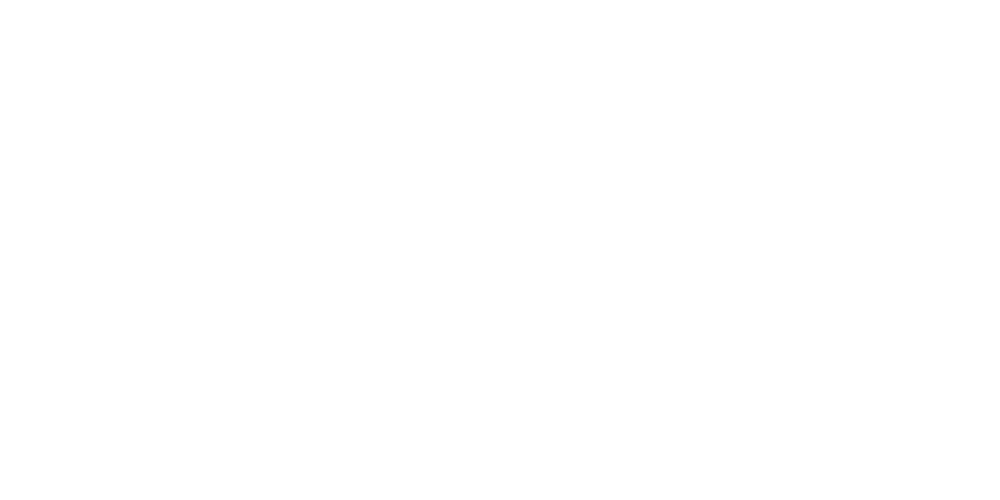

1692


/tmp/ipykernel_13836/710390581.py:65: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


0.8428571428571429


<IPython.core.display.Javascript object>


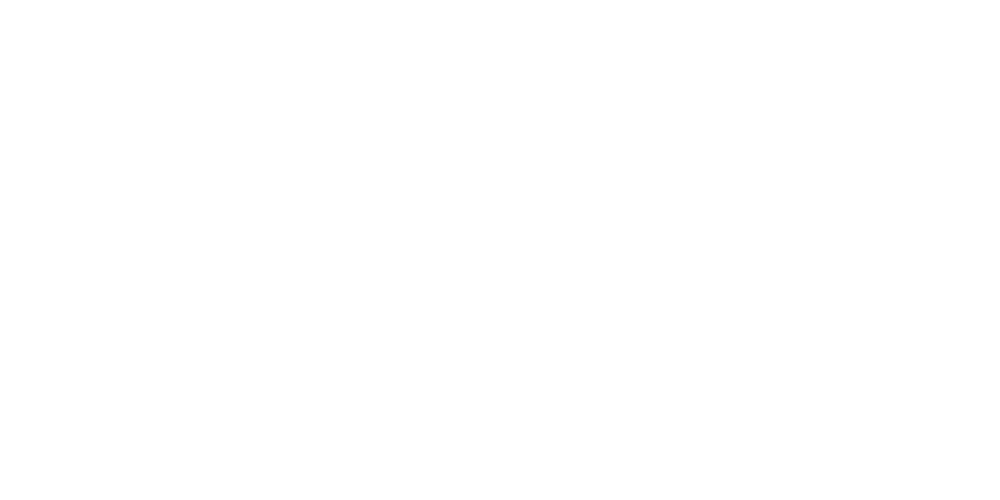

In [11]:
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel
m_p=1
Fps=1
frames = pims.open('mouse_tcr3/*.jpg')
label.append('WT')
conect=4
mem=5
size=7
mass=100
filt=9
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
#rmin=40
#rmax=100
rmin=20
rmax=70
tm,data=find_traj_data(frames,conect,mem,size,mass,filt)
ee,xe,ye,iid=find_ee_distance2(data)
x_cm,y_cm=find_cm(frames,tm,size)
x_cm=288
y_cm=260
print(x_cm,y_cm)
c=4
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance2(data,x_cm,y_cm)
x,y,t=in_out2(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)
plt.imshow(frames[0])
plt.show()


frames = pims.open('mouse_actin3/*.jpg')
display= pims.open('mouse_tcr3/*.jpg')
error_threshold = 0.5
corelation=0
tot_coord=0
print(len(frames))
edge_store_x=[]
edge_store_y=[]
x_store=[]
y_store=[]
for f in range(100):
    
   
            
            
    # Plot the actin density from the current frame
    first_frame = frames[f]
    display_loop=display[f]
    ax.cla()
    frame_curr = first_frame/255
    ax.imshow(frame_curr,origin='lower',cmap="Greys_r",vmin=0,vmax=1)
    # Load the image

    image = first_frame

    # Convert the image to grayscale
    gray_image = color.rgb2gray(image)

    blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
    binary_img = np.where(blurred_frame > threshold, 1,0)
    center_of_mass = ndimage.measurements.center_of_mass(binary_img)
    # Detect edges using Canny edge detection
    edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=40)
    edge_coords = []
    rows, cols = edges.shape
    threshold = 20  # Radial distance threshold

    for row in range(rows):
        for col in range(cols):
            if edges[row, col]:
                # Calculate the radial distance between the edge coordinate and the center
                radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
                # Exclude points with radial distance less than the threshold
                if radial_distance >= threshold:
                    edge_coords.append((col, row))  # Append (x, y) coordinates
                    
    
    # Plot the original image with the edges overlay
    #fig, ax = plt.subplots(figsize=(8, 8))
    #ax.imshow(display_loop)
   # ax.imshow(edges, alpha=0.3) 
    ax.axis('off')

    # Plot the edge coordinates as a scatter plot
    edge_coords = np.array(edge_coords)
    ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='blue', s=0.5)
   
    for i,t_particle_i in enumerate(t):
        for j,ti in enumerate(t_particle_i):
            if ti==f:   ## check if particle frame is the same
              #  print(x[i][j],edge_coords[:, 0])
                x_store.append(x[i][j])
                y_store.append(y[i][j])
                tot_coord += 1
                #print(xi,edge_coords[:, 0])
                # Check if xi is within error_threshold of any value in edge_coords[:, 0]
                xi_within_range = any(abs(x[i][j] - edge_x) <= error_threshold for edge_x in edge_coords[:, 0])
                yi_within_range = any(abs(y[i][j] - edge_y) <= error_threshold for edge_y in edge_coords[:, 1])
                #print(xi_within_range)
                if xi_within_range==True and yi_within_range==True:
                    corelation += 1
    #print(corelation/tot_coord)             
   # ax.set_title("Frame no %03d"%f)
    #plt.savefig("wt_1/frame_%03d.png"%f,bbox_inches="tight")
print(corelation/tot_coord)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()
ratio.append(corelation/tot_coord)

/tmp/ipykernel_13836/2045948950.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


<IPython.core.display.Javascript object>


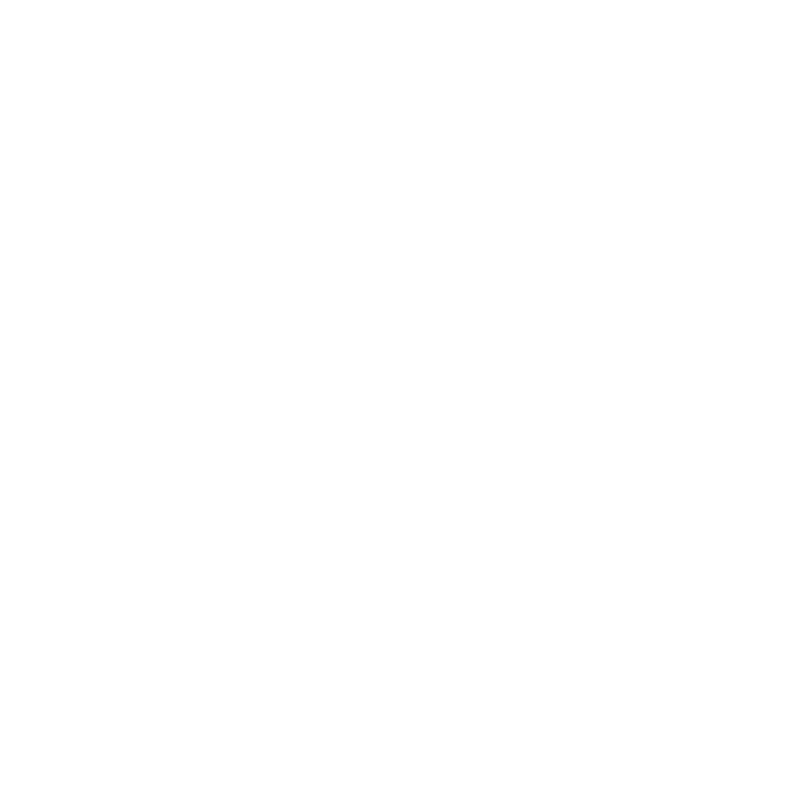

len 1180


In [12]:
import matplotlib.pyplot as plt
from skimage import io, color, feature
frames = pims.open('mouse_actin4/*.jpg')


import cv2
first_frame = frames[1]
# Load the image

image = first_frame

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
binary_img = np.where(blurred_frame > 20, 1,0)
center_of_mass = ndimage.measurements.center_of_mass(binary_img)
# Detect edges using Canny edge detection
edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=30)
edge_coords = []
rows, cols = edges.shape
threshold = 20  # Radial distance threshold

for row in range(rows):
    for col in range(cols):
        if edges[row, col]:
            # Calculate the radial distance between the edge coordinate and the center
            radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
            # Exclude points with radial distance less than the threshold
            if radial_distance >= threshold:
                edge_coords.append((col, row))  # Append (x, y) coordinates
# Plot the original image with the edges overlay`
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image)
#ax.imshow(edges, alpha=0.3)
ax.axis('off')

# Plot the edge coordinates as a scatter plot
edge_coords = np.array(edge_coords)
ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='blue', s=0.5)
print('len',len(edge_coords))
plt.show()

/tmp/ipykernel_13836/4046708184.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


<IPython.core.display.Javascript object>


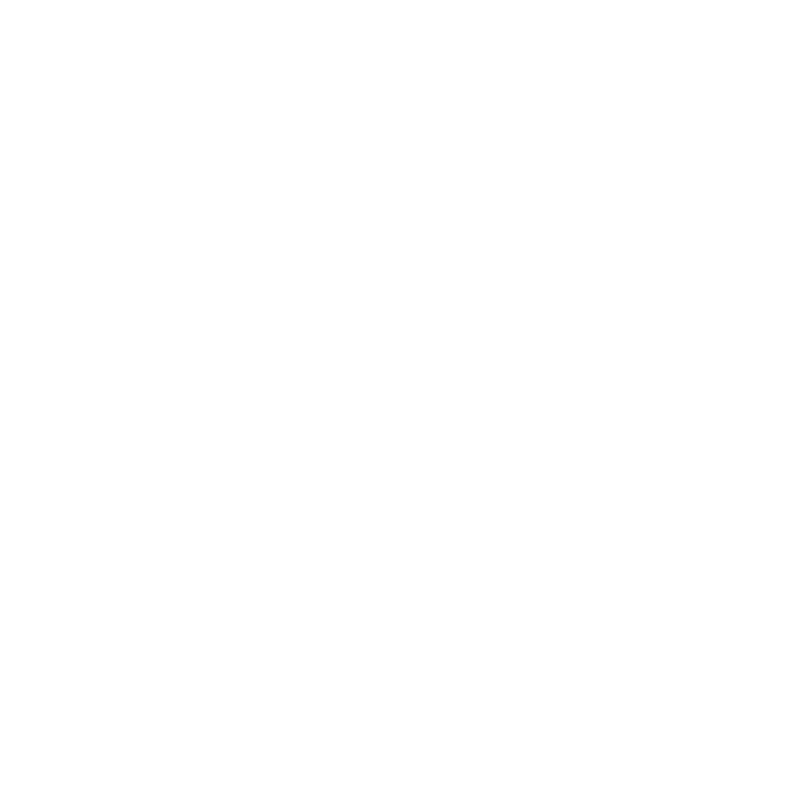

len 832


In [13]:
import matplotlib.pyplot as plt
from skimage import io, color, feature
frames = pims.open('actin_spare3/*.jpg')


import cv2
first_frame = frames[1]
# Load the image

image = first_frame

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
binary_img = np.where(blurred_frame > 20, 1,0)
center_of_mass = ndimage.measurements.center_of_mass(binary_img)
# Detect edges using Canny edge detection
edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=40)
edge_coords = []
rows, cols = edges.shape
threshold = 20  # Radial distance threshold

for row in range(rows):
    for col in range(cols):
        if edges[row, col]:
            # Calculate the radial distance between the edge coordinate and the center
            radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
            # Exclude points with radial distance less than the threshold
            if radial_distance >= threshold:
                edge_coords.append((col, row))  # Append (x, y) coordinates
# Plot the original image with the edges overlay`
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image)
#ax.imshow(edges, alpha=0.3)
ax.axis('off')

# Plot the edge coordinates as a scatter plot
edge_coords = np.array(edge_coords)
ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='#4dff4d', s=0.5)
print('len',len(edge_coords))
plt.show()

Frame 199: 89 features
227 278
227 278


<IPython.core.display.Javascript object>


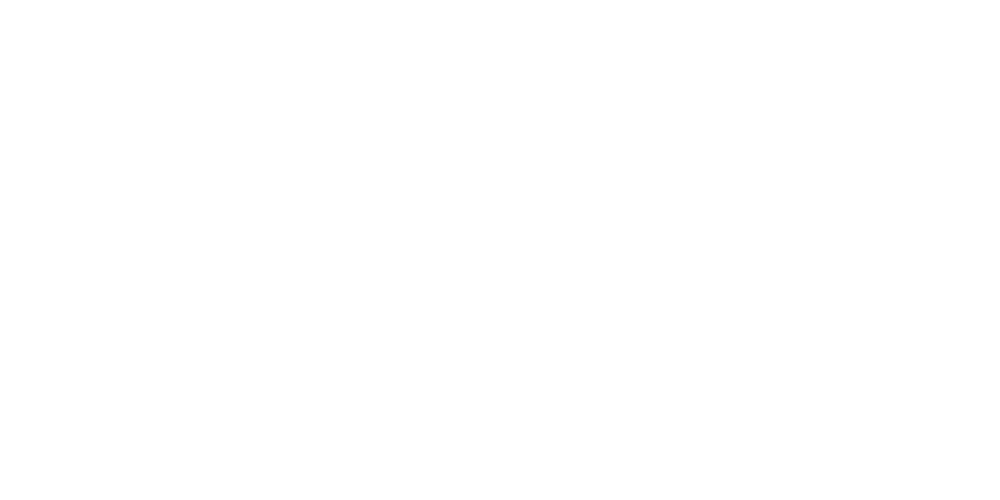

216


/tmp/ipykernel_13836/876526564.py:64: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


0.9229651162790697


<IPython.core.display.Javascript object>


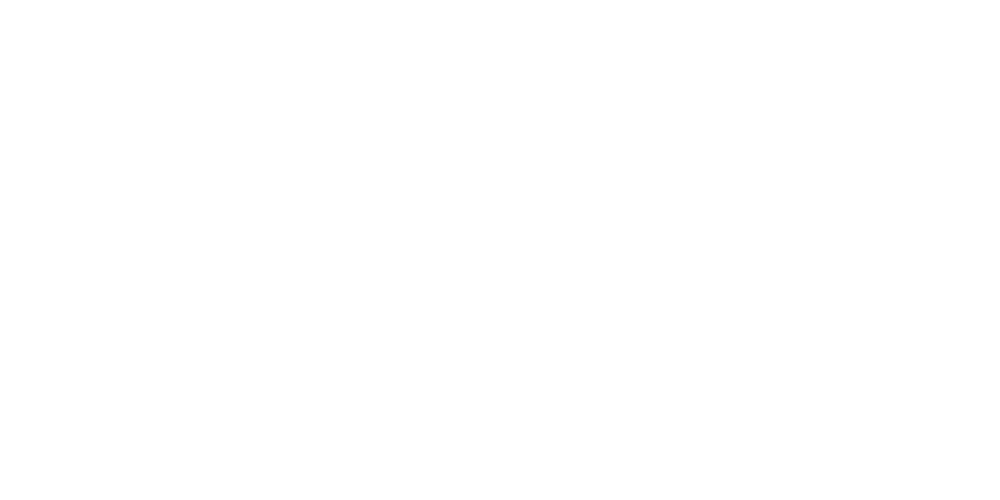

In [14]:
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel
m_p=1
Fps=1
frames = pims.open('spare3_TCR/*.jpg')
label.append('WT')
conect=4
mem=5
size=7
mass=80
filt=8
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
#rmin=40
#rmax=100
rmin=20
rmax=60
tm,data=find_traj_data(frames,conect,mem,size,mass,filt)
ee,xe,ye,iid=find_ee_distance2(data)
x_cm,y_cm=find_cm(frames,tm,size)
x_cm=227
y_cm=278
print(x_cm,y_cm)
c=4
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance2(data,x_cm,y_cm)
x,y,t=in_out2(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)
plt.imshow(frames[0])
plt.show()

frames = pims.open('actin_spare3/*.jpg')
display= pims.open('spare3_TCR/*.jpg')
error_threshold = 0.5
corelation=0
tot_coord=0
print(len(frames))
edge_store_x=[]
edge_store_y=[]
x_store=[]
y_store=[]
for f in range(100):
    
   
            
            
    # Plot the actin density from the current frame
    first_frame = frames[f]
    display_loop=display[f]
    ax.cla()
    frame_curr = first_frame/255
    ax.imshow(frame_curr,origin='lower',cmap="Greys_r",vmin=0,vmax=1)
    # Load the image

    image = first_frame

    # Convert the image to grayscale
    gray_image = color.rgb2gray(image)

    blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
    binary_img = np.where(blurred_frame > threshold, 1,0)
    center_of_mass = ndimage.measurements.center_of_mass(binary_img)
    # Detect edges using Canny edge detection
    edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=40)
    edge_coords = []
    rows, cols = edges.shape
    threshold = 20  # Radial distance threshold

    for row in range(rows):
        for col in range(cols):
            if edges[row, col]:
                # Calculate the radial distance between the edge coordinate and the center
                radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
                # Exclude points with radial distance less than the threshold
                if radial_distance >= threshold:
                    edge_coords.append((col, row))  # Append (x, y) coordinates
                    
    
    # Plot the original image with the edges overlay
    #fig, ax = plt.subplots(figsize=(8, 8))
    #ax.imshow(display_loop)
   # ax.imshow(edges, alpha=0.3) 
    ax.axis('off')

    # Plot the edge coordinates as a scatter plot
    edge_coords = np.array(edge_coords)
    ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='blue', s=0.5)
    for x_edge in edge_coords[:, 0]:
        edge_store_x.append(x_edge)
        
    for y_edge in edge_coords[:, 1]:
        edge_store_y.append(y_edge)
    for i,t_particle_i in enumerate(t):
        for j,ti in enumerate(t_particle_i):
            if ti==f:   ## check if particle frame is the same
              #  print(x[i][j],edge_coords[:, 0])
                x_store.append(x[i][j])
                y_store.append(y[i][j])
                tot_coord += 1
                #print(xi,edge_coords[:, 0])
                # Check if xi is within error_threshold of any value in edge_coords[:, 0]
                xi_within_range = any(abs(x[i][j] - edge_x) <= error_threshold for edge_x in edge_coords[:, 0])
                yi_within_range = any(abs(y[i][j] - edge_y) <= error_threshold for edge_y in edge_coords[:, 1])
                #print(xi_within_range)
                if xi_within_range==True and yi_within_range==True:
                    corelation += 1
    #print(corelation/tot_coord)             
   # ax.set_title("Frame no %03d"%f)
    #plt.savefig("wt_1/frame_%03d.png"%f,bbox_inches="tight")
print(corelation/tot_coord)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()
ratio.append(corelation/tot_coord)


/tmp/ipykernel_13836/3481746162.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


<IPython.core.display.Javascript object>


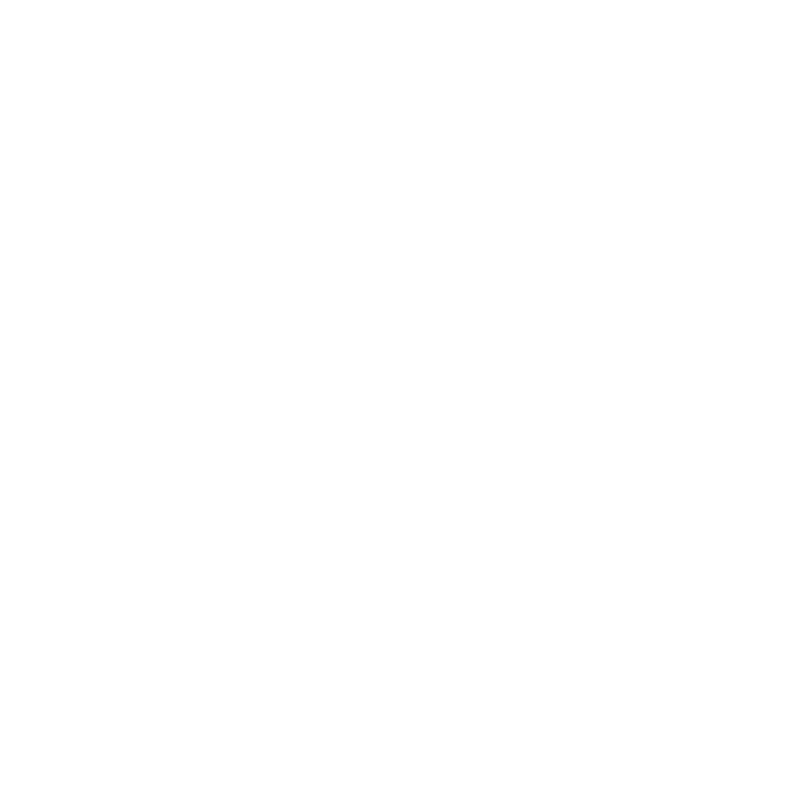

len 1438


In [15]:
import matplotlib.pyplot as plt
from skimage import io, color, feature
frames = pims.open('waspneg_actin1/*.jpg')


import cv2
first_frame = frames[1]
# Load the image

image = first_frame

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
binary_img = np.where(blurred_frame > 40, 1,0)
center_of_mass = ndimage.measurements.center_of_mass(binary_img)
# Detect edges using Canny edge detection
edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=40)
edge_coords = []
rows, cols = edges.shape
threshold = 20  # Radial distance threshold

for row in range(rows):
    for col in range(cols):
        if edges[row, col]:
            # Calculate the radial distance between the edge coordinate and the center
            radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
            # Exclude points with radial distance less than the threshold
            if radial_distance >= threshold:
                edge_coords.append((col, row))  # Append (x, y) coordinates
# Plot the original image with the edges overlay`
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image)
#ax.imshow(edges, alpha=0.3)
ax.axis('off')

# Plot the edge coordinates as a scatter plot
edge_coords = np.array(edge_coords)
ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='#4dff4d', s=0.5)
print('len',len(edge_coords))
plt.show()

Frame 199: 7 features
275.87242530090623 225.63816429389627
275.87242530090623 225.63816429389627


<IPython.core.display.Javascript object>


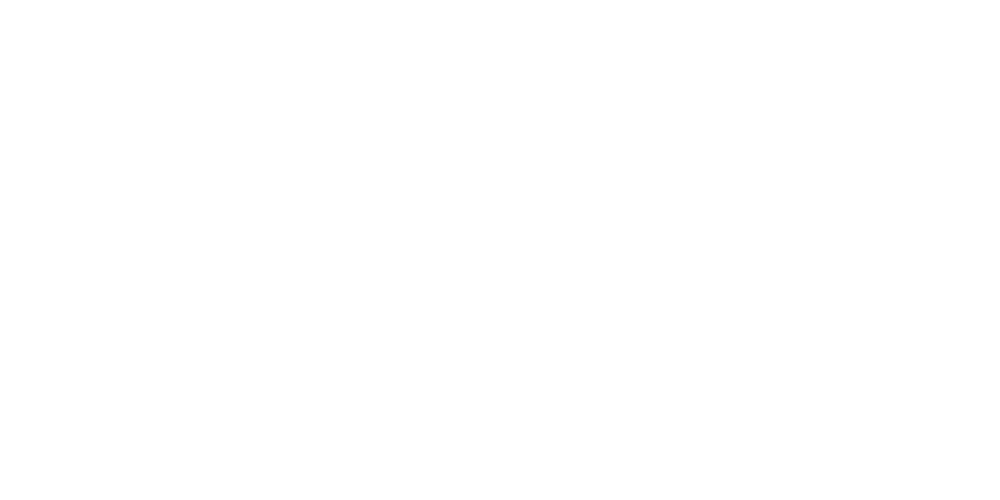

300


/tmp/ipykernel_13836/2381060405.py:65: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


0.6405867970660146


<IPython.core.display.Javascript object>


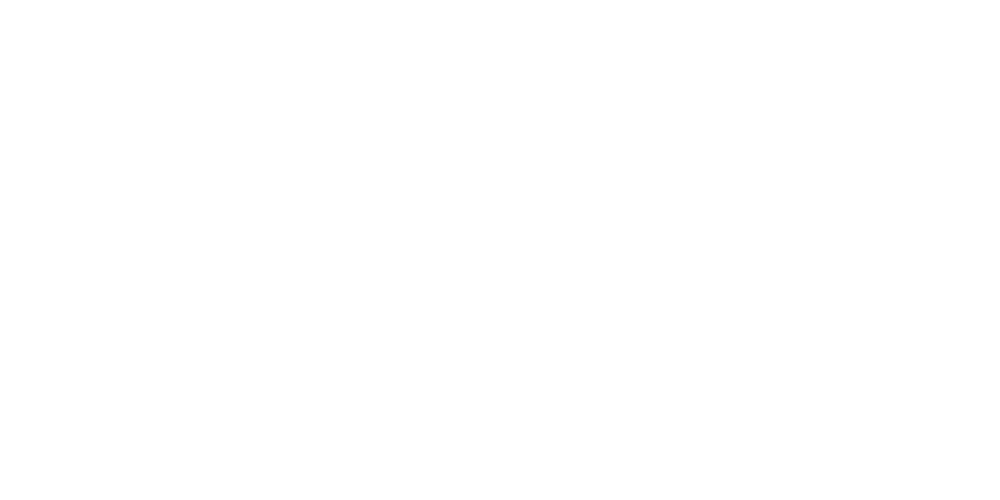

In [16]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel
m_p=1
Fps=1
frames = pims.open('waspneg_tcr1/*.jpg')
label.append('WASP')
conect=4
mem=5
size=7
mass=60
filt=7
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]

#rmax=100
rmin=10
rmax=60
tm,data=find_traj_data(frames,conect,mem,size,mass,filt)
ee,xe,ye,iid=find_ee_distance2(data)
x_cm,y_cm=find_cm(frames,tm,size)

print(x_cm,y_cm)
c=4
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance2(data,x_cm,y_cm)
x,y,t=in_out2(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)
plt.imshow(frames[0])
plt.show()


frames = pims.open('waspneg_tcr1/*.jpg')
display= pims.open('waspneg_actin1/*.jpg')
error_threshold = 0.5
corelation=0
tot_coord=0
print(len(frames))
edge_store_x=[]
edge_store_y=[]
x_store=[]
y_store=[]
for f in range(0,100):
    
   
            
            
    # Plot the actin density from the current frame
    first_frame = frames[f]
    display_loop=display[f]
    #ax.cla()
    frame_curr = first_frame/255
    ax.imshow(frame_curr,origin='lower',cmap="Greys_r",vmin=0,vmax=1)
    # Load the image

    image = first_frame

    # Convert the image to grayscale
    gray_image = color.rgb2gray(image)

    blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
    binary_img = np.where(blurred_frame > threshold, 1,0)
    center_of_mass = ndimage.measurements.center_of_mass(binary_img)
    # Detect edges using Canny edge detection
    edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=40)
    edge_coords = []
    rows, cols = edges.shape
    threshold = 20  # Radial distance threshold

    for row in range(rows):
        for col in range(cols):
            if edges[row, col]:
                # Calculate the radial distance between the edge coordinate and the center
                radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
                # Exclude points with radial distance less than the threshold
                if radial_distance >= threshold:
                    edge_coords.append((col, row))  # Append (x, y) coordinates
                    
    
    #Plot the original image with the edges overlay
   # fig, ax = plt.subplots(figsize=(8, 8))
    #ax.imshow(display_loop)
    #ax.imshow(edges, alpha=0.3) 
    #ax.axis('off')

    # Plot the edge coordinates as a scatter plot
    edge_coords = np.array(edge_coords)
    #ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='blue', s=0.5)
    
    for i,t_particle_i in enumerate(t):
        for j,ti in enumerate(t_particle_i):
            if ti==f:   ## check if particle frame is the same
              #  print(x[i][j],edge_coords[:, 0])
                if ti==50:
                    x_store.append(x[i][j])
                    y_store.append(y[i][j])
                tot_coord += 1
                #print(xi,edge_coords[:, 0])
                # Check if xi is within error_threshold of any value in edge_coords[:, 0]
                xi_within_range = any(abs(x[i][j] - edge_x) <= error_threshold for edge_x in edge_coords[:, 0])
                yi_within_range = any(abs(y[i][j] - edge_y) <= error_threshold for edge_y in edge_coords[:, 1])
                #print(xi_within_range)
                if xi_within_range==True and yi_within_range==True:
                    corelation += 1
    #print(corelation/tot_coord)             
    #ax.set_title("Frame no %03d"%f)
    #plt.savefig("ck666_1/frame_%03d.png"%f,bbox_inches="tight")
print(corelation/tot_coord)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()
ratio.append(corelation/tot_coord)

/tmp/ipykernel_13836/2288555702.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


<IPython.core.display.Javascript object>


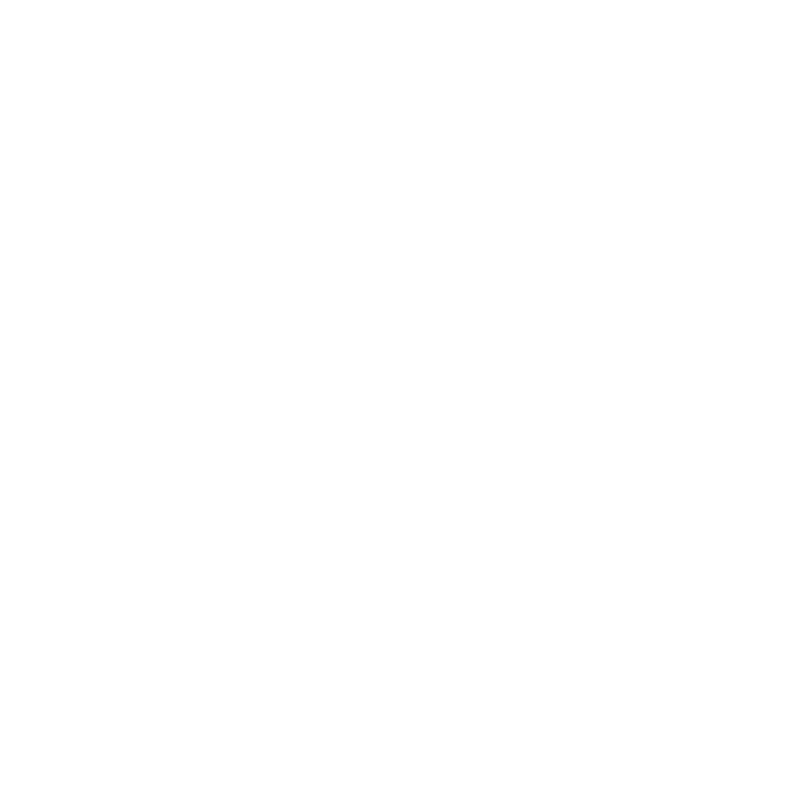

len 1267


In [17]:
import matplotlib.pyplot as plt
from skimage import io, color, feature
frames = pims.open('waspneg_actin1/*.jpg')

display=pims.open('waspneg_tcr1/*.jpg')
import cv2
first_frame = frames[100]
# Load the image
display_img=display[100]
image = first_frame

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
binary_img = np.where(blurred_frame > 20, 1,0)
center_of_mass = ndimage.measurements.center_of_mass(binary_img)
# Detect edges using Canny edge detection
edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=40)
edge_coords = []
rows, cols = edges.shape
threshold = 20  # Radial distance threshold

for row in range(rows):
    for col in range(cols):
        if edges[row, col]:
            # Calculate the radial distance between the edge coordinate and the center
            radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
            # Exclude points with radial distance less than the threshold
            if radial_distance >= threshold:
                edge_coords.append((col, row))  # Append (x, y) coordinates
# Plot the original image with the edges overlay`
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(display_img)
#ax.imshow(edges, alpha=0.3)
ax.axis('off')

# Plot the edge coordinates as a scatter plot
edge_coords = np.array(edge_coords)
ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='#4dff4d', s=0.5)
print('len',len(edge_coords))
plt.show()
plt.scatter(x_store,y_store,facecolors='none', edgecolors='r')

/tmp/ipykernel_13836/2912524802.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


<IPython.core.display.Javascript object>


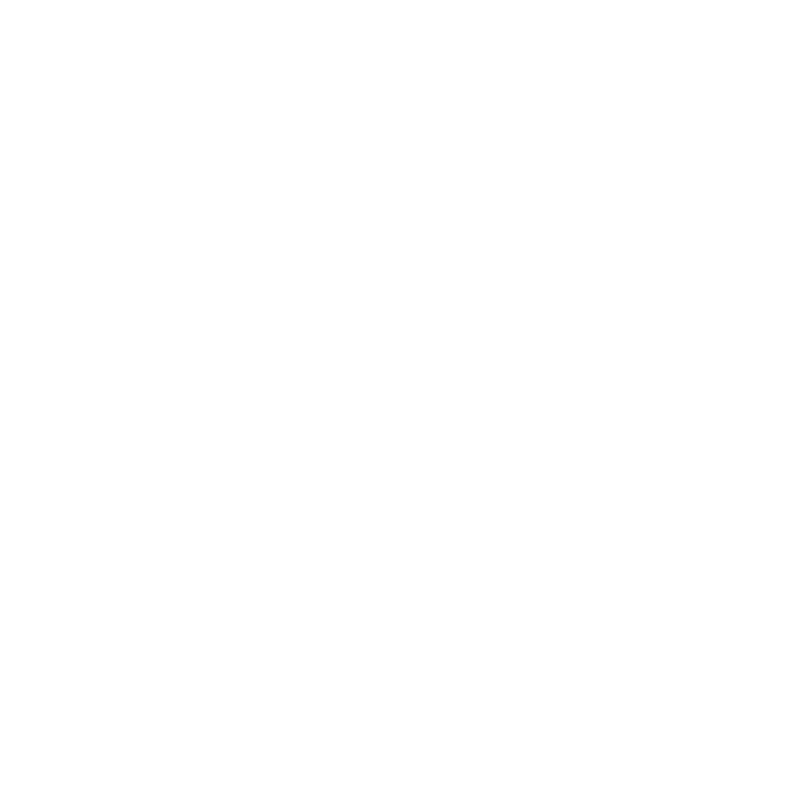

len 1329


In [18]:
import matplotlib.pyplot as plt
from skimage import io, color, feature
frames = pims.open('waspneg_actin2/*.jpg')


import cv2
first_frame = frames[1]
# Load the image

image = first_frame

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)

center_of_mass = ndimage.measurements.center_of_mass(binary_img)
# Detect edges using Canny edge detection
edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=40)
edge_coords = []
rows, cols = edges.shape
threshold = 20  # Radial distance threshold

for row in range(rows):
    for col in range(cols):
        if edges[row, col]:
            # Calculate the radial distance between the edge coordinate and the center
            radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
            # Exclude points with radial distance less than the threshold
            if radial_distance >= threshold:
                edge_coords.append((col, row))  # Append (x, y) coordinates
# Plot the original image with the edges overlay`
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image)
#ax.imshow(edges, alpha=0.3)
ax.axis('off')
print('len',len(edge_coords))
# Plot the edge coordinates as a scatter plot
edge_coords = np.array(edge_coords)
ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='blue', s=0.5)

plt.show()

Frame 199: 7 features
275.78303360852243 225.7471692610118
275.78303360852243 225.7471692610118


<IPython.core.display.Javascript object>


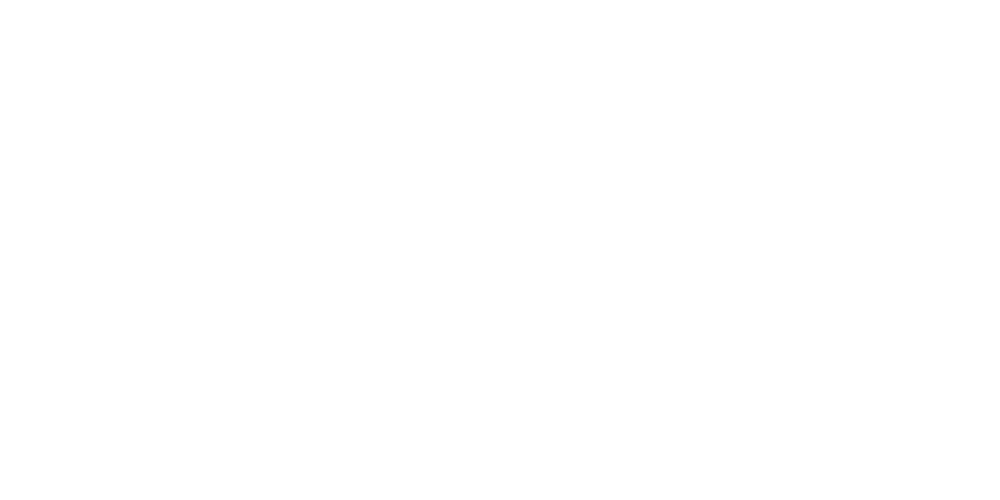

300


/tmp/ipykernel_13836/3902908920.py:66: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


0.1794871794871795


<IPython.core.display.Javascript object>


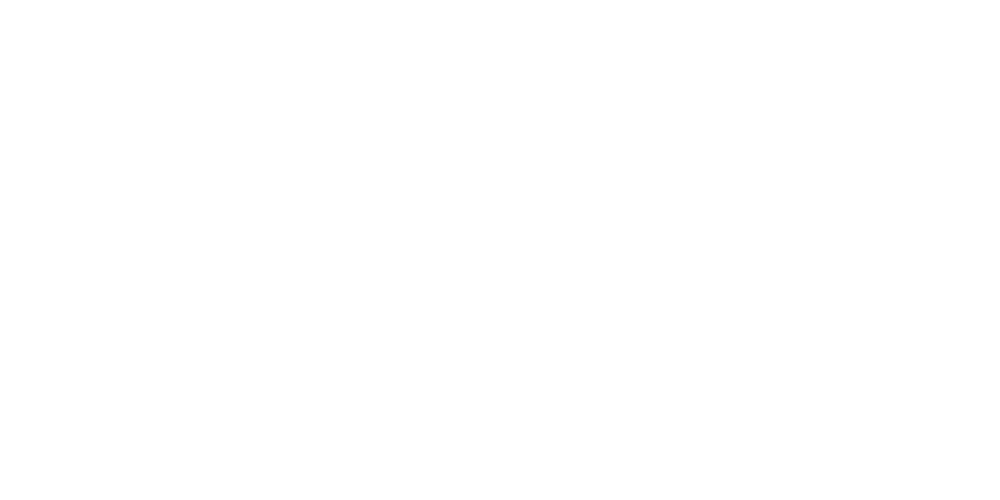

In [19]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel
m_p=1
Fps=1
frames = pims.open('waspneg_tcr2/*.jpg')
label.append('WASP')
conect=4
mem=5
size=7
mass=40
filt=7
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]

#rmax=100
rmin=10
rmax=60
tm,data=find_traj_data(frames,conect,mem,size,mass,filt)
ee,xe,ye,iid=find_ee_distance2(data)
x_cm,y_cm=find_cm(frames,tm,size)

print(x_cm,y_cm)
c=3
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance2(data,x_cm,y_cm)
x,y,t=in_out2(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)
plt.imshow(frames[0])
#plt.show()


frames = pims.open('waspneg_tcr2/*.jpg')
display= pims.open('waspneg_actin2/*.jpg')
error_threshold = 0.5
corelation=0
tot_coord=0
print(len(frames))
edge_store_x=[]
edge_store_y=[]
x_store=[]
y_store=[]
for f in range(0,100):
    
   
            
            
    # Plot the actin density from the current frame
    first_frame = frames[f]
    display_loop=display[f]
    #ax.cla()
    frame_curr = first_frame/255
    ax.imshow(frame_curr,origin='lower',cmap="Greys_r",vmin=0,vmax=1)
    # Load the image

    image = first_frame

    # Convert the image to grayscale
    gray_image = color.rgb2gray(image)

    blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
    binary_img = np.where(blurred_frame > threshold, 1,0)
    center_of_mass = ndimage.measurements.center_of_mass(binary_img)
    # Detect edges using Canny edge detection
    edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=40)
    edge_coords = []
    rows, cols = edges.shape
    threshold = 20  # Radial distance threshold

    for row in range(rows):
        for col in range(cols):
            if edges[row, col]:
                # Calculate the radial distance between the edge coordinate and the center
                radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
                # Exclude points with radial distance less than the threshold
                if radial_distance >= threshold:
                    edge_coords.append((col, row))  # Append (x, y) coordinates
                    
    
    #Plot the original image with the edges overlay
   # fig, ax = plt.subplots(figsize=(8, 8))
    #ax.imshow(display_loop)
    #ax.imshow(edges, alpha=0.3) 
    #ax.axis('off')

    # Plot the edge coordinates as a scatter plot
    edge_coords = np.array(edge_coords)
    #ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='blue', s=0.5)
    
    for i,t_particle_i in enumerate(t):
        for j,ti in enumerate(t_particle_i):
            if ti==f:   ## check if particle frame is the same
              #  print(x[i][j],edge_coords[:, 0])
                x_store.append(x[i][j])
                y_store.append(y[i][j])
                tot_coord += 1
                #print(xi,edge_coords[:, 0])
                # Check if xi is within error_threshold of any value in edge_coords[:, 0]
                xi_within_range = any(abs(x[i][j] - edge_x) <= error_threshold for edge_x in edge_coords[:, 0])
                yi_within_range = any(abs(y[i][j] - edge_y) <= error_threshold for edge_y in edge_coords[:, 1])
                #print(xi_within_range)
                if xi_within_range==True and yi_within_range==True:
                    corelation += 1
    #print(corelation/tot_coord)             
    #ax.set_title("Frame no %03d"%f)
    #plt.savefig("ck666_1/frame_%03d.png"%f,bbox_inches="tight")
print(corelation/tot_coord)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()
ratio.append(corelation/tot_coord)

/tmp/ipykernel_13836/225031168.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


<IPython.core.display.Javascript object>


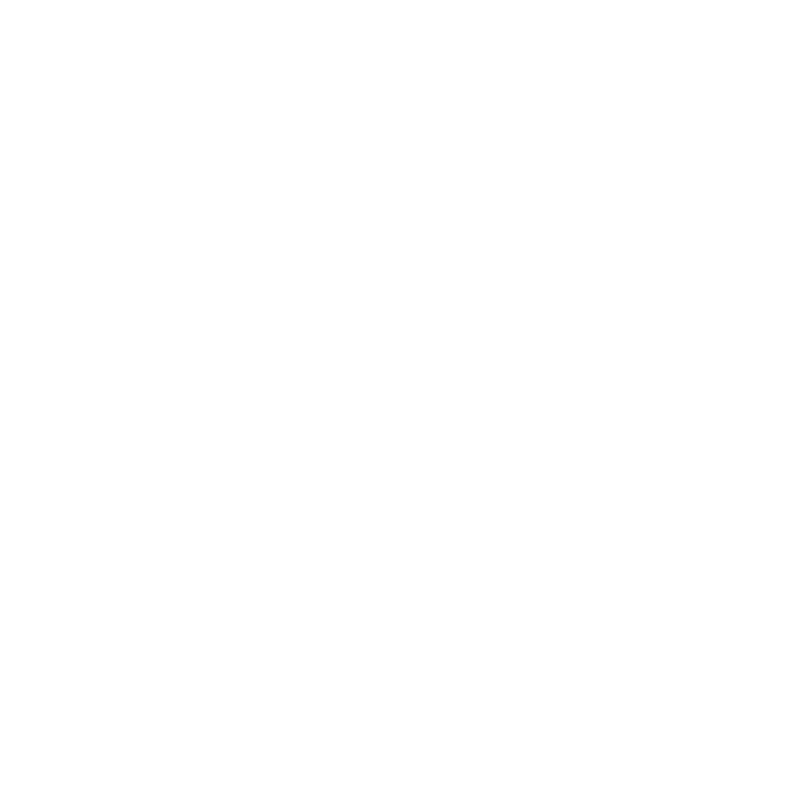

len 1379


In [20]:
import matplotlib.pyplot as plt
from skimage import io, color, feature
frames = pims.open('waspneg_actin3/*.jpg')


import cv2
first_frame = frames[1]
# Load the image

image = first_frame

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
binary_img = np.where(blurred_frame > 40, 1,0)
center_of_mass = ndimage.measurements.center_of_mass(binary_img)
# Detect edges using Canny edge detection
edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=40)
edge_coords = []
rows, cols = edges.shape
threshold = 20  # Radial distance threshold

for row in range(rows):
    for col in range(cols):
        if edges[row, col]:
            # Calculate the radial distance between the edge coordinate and the center
            radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
            # Exclude points with radial distance less than the threshold
            if radial_distance >= threshold:
                edge_coords.append((col, row))  # Append (x, y) coordinates
# Plot the original image with the edges overlay`
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image)
#ax.imshow(edges, alpha=0.3)
ax.axis('off')
print('len',len(edge_coords))
# Plot the edge coordinates as a scatter plot
edge_coords = np.array(edge_coords)
ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='#4dff4d', s=0.5)
# Create scale bar
scalebar = ScaleBar(41.7, "nm", length_fraction=0.25)
ax.add_artist(scalebar)
plt.show()

Frame 199: 11 features
266.67387173205 298.9853043101116
266.67387173205 298.9853043101116


<IPython.core.display.Javascript object>


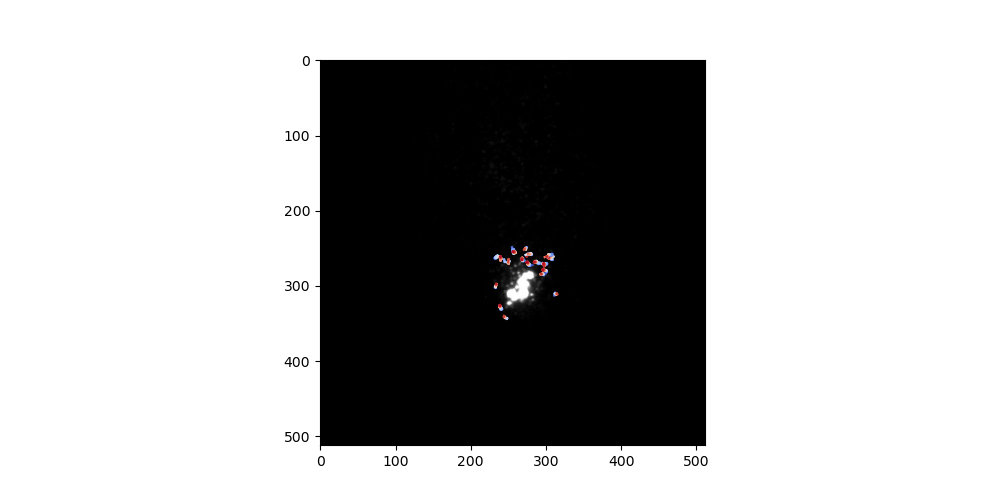

900


/tmp/ipykernel_13836/2663349942.py:66: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


0.4673024523160763


<IPython.core.display.Javascript object>


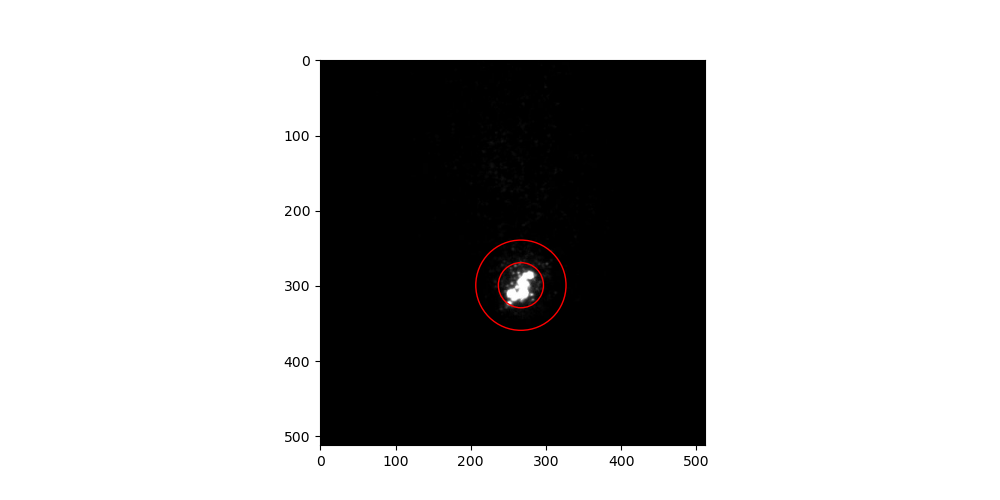

In [21]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

m_p=1
Fps=1
frames = pims.open('waspneg_tcr3/*.jpg')
label.append('WASP')
conect=4
mem=5
size=7
mass=80
filt=7
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]

#rmax=100
rmin=30
rmax=60
tm,data=find_traj_data(frames,conect,mem,size,mass,filt)
ee,xe,ye,iid=find_ee_distance2(data)
x_cm,y_cm=find_cm(frames,tm,size)

print(x_cm,y_cm)
c=3
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance2(data,x_cm,y_cm)
x,y,t=in_out2(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)
plt.imshow(frames[0])
#plt.show()

show_frame=60
frames = pims.open('waspneg_tcr3/*.jpg')
display= pims.open('waspneg_actin3/*.jpg')
error_threshold = 0.5
corelation=0
tot_coord=0
print(len(frames))
edge_store_x=[]
edge_store_y=[]
x_store=[]
y_store=[]
for f in range(0,100):
    
   
            
            
    # Plot the actin density from the current frame
    first_frame = frames[f]
    display_loop=display[f]
    #ax.cla()
    frame_curr = first_frame/255
    ax.imshow(frame_curr,origin='lower',cmap="Greys_r",vmin=0,vmax=1)
    # Load the image

    image = first_frame

    # Convert the image to grayscale
    gray_image = color.rgb2gray(image)

    blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
    binary_img = np.where(blurred_frame > threshold, 1,0)
    center_of_mass = ndimage.measurements.center_of_mass(binary_img)
    # Detect edges using Canny edge detection
    edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=40)
    edge_coords = []
    rows, cols = edges.shape
    threshold = 20  # Radial distance threshold

    for row in range(rows):
        for col in range(cols):
            if edges[row, col]:
                # Calculate the radial distance between the edge coordinate and the center
                radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
                # Exclude points with radial distance less than the threshold
                if radial_distance >= threshold:
                    edge_coords.append((col, row))  # Append (x, y) coordinates
                    
    
    #Plot the original image with the edges overlay
   # fig, ax = plt.subplots(figsize=(8, 8))
    #ax.imshow(display_loop)
    #ax.imshow(edges, alpha=0.3) 
    #ax.axis('off')

    # Plot the edge coordinates as a scatter plot
    edge_coords = np.array(edge_coords)
    #ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='blue', s=0.5)
    
    for i,t_particle_i in enumerate(t):
        for j,ti in enumerate(t_particle_i):
            if ti==f:   ## check if particle frame is the same
              #  print(x[i][j],edge_coords[:, 0])
                if ti==show_frame:
                    x_store.append(x[i][j])
                    y_store.append(y[i][j])
                tot_coord += 1
                #print(xi,edge_coords[:, 0])
                # Check if xi is within error_threshold of any value in edge_coords[:, 0]
                xi_within_range = any(abs(x[i][j] - edge_x) <= error_threshold for edge_x in edge_coords[:, 0])
                yi_within_range = any(abs(y[i][j] - edge_y) <= error_threshold for edge_y in edge_coords[:, 1])
                #print(xi_within_range)
                if xi_within_range==True and yi_within_range==True:
                    corelation += 1
    #print(corelation/tot_coord)             
    #ax.set_title("Frame no %03d"%f)
    #plt.savefig("ck666_1/frame_%03d.png"%f,bbox_inches="tight")
print(corelation/tot_coord)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()
ratio.append(corelation/tot_coord)

/tmp/ipykernel_13836/3265918923.py:14: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray_image = color.rgb2gray(image)


<IPython.core.display.Javascript object>


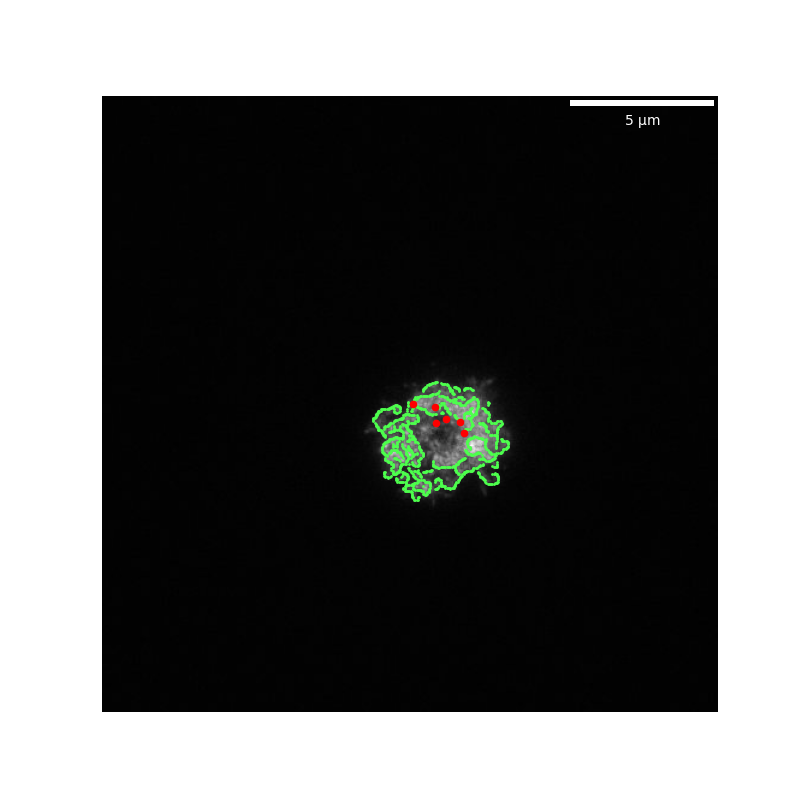

len 1162


In [22]:
import matplotlib.pyplot as plt
from skimage import io, color, feature
frames = pims.open('waspneg_actin3/*.jpg')

display=pims.open('waspneg_actin3/*.jpg')
import cv2

first_frame = frames[show_frame]
# Load the image
display_img=display[show_frame]
image = first_frame

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

blurred_frame = cv2.GaussianBlur(first_frame, (5, 5),100)  # Applying Gaussian blur with kernel size (5, 5)
binary_img = np.where(blurred_frame > 20, 1,0)
center_of_mass = ndimage.measurements.center_of_mass(binary_img)
# Detect edges using Canny edge detection
edges = feature.canny(blurred_frame ,low_threshold=10, high_threshold=50)
edge_coords = []
rows, cols = edges.shape
threshold = 20  # Radial distance threshold

for row in range(rows):
    for col in range(cols):
        if edges[row, col]:
            # Calculate the radial distance between the edge coordinate and the center
            radial_distance = np.sqrt((col - center_of_mass[1]) ** 2 + (row - center_of_mass[0]) ** 2)
            
            # Exclude points with radial distance less than the threshold
            if radial_distance >= threshold:
                edge_coords.append((col, row))  # Append (x, y) coordinates
# Plot the original image with the edges overlay`
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(display_img)
#ax.imshow(edges, alpha=0.3)
ax.axis('off')

# Plot the edge coordinates as a scatter plot
edge_coords = np.array(edge_coords)
ax.scatter(edge_coords[:, 0], edge_coords[:, 1], color='#4dff4d', s=1)
print('len',len(edge_coords))
plt.show()
plt.scatter(x_store,y_store,facecolors='r', edgecolors='r',s=20)
# Create scale bar
scalebar = ScaleBar(41.7, "nm", scale_loc='bottom', length_fraction=0.25, color='white', box_alpha=0)


ax.add_artist(scalebar)

Mann-Whitney U Statistic: 12.0
Two-Sided P-Value: 0.05714285714285714


<IPython.core.display.Javascript object>


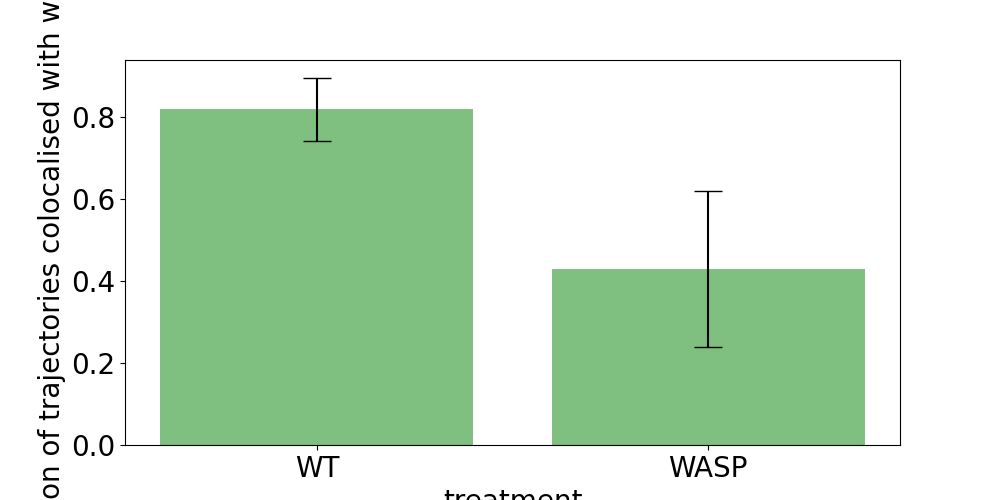

[0 1]
dict_values([0.8184369139569347, 0.4291254762897568])
dict_values([0.07585657832526134, 0.19016891694267077])


In [23]:
from matplotlib.font_manager import FontProperties
from scipy.stats import mannwhitneyu
# Create a dictionary to store the sums and counts for each string
values = ratio

strings =label
# Separate data into two groups (e.g., 'Jurkat' and 'Mouse')
jurkat_values = [value for value, string in zip(values, strings) if string.startswith('WT')]
mouse_values = [value for value, string in zip(values, strings) if string.startswith('WASP')]

# Calculate the Mann-Whitney U statistic and p-value
u_statistic, p_value = mannwhitneyu(jurkat_values, mouse_values, alternative='two-sided')

# Print the results
print("Mann-Whitney U Statistic:", u_statistic)
print("Two-Sided P-Value:", p_value)



# Create a dictionary to store the sums and counts for each string

sums = {}

counts = {}



# Loop over the values and strings lists, updating the sums and counts in the dictionary

for value, string in zip(values, strings):

    if string not in sums:

        sums[string] = 0

        counts[string] = 0

    sums[string] += value

    counts[string] += 1



# Calculate the averages and standard errors for each string

averages = {}

errors = {}

for string in sums:

    averages[string] = sums[string] / counts[string]

    errors[string] = np.sqrt(np.var([value for value, string2 in zip(values, strings) if string2 == string]))/1  # Standard error



# Plot the bar chart with error bars

x = np.arange(len(averages))

fig, ax = plt.subplots()

ax.bar(x, averages.values(), yerr=errors.values(), align='center', alpha=0.5, ecolor='black', capsize=10,color='g')

ax.set_xticks(x)

ax.set_xticklabels(averages.keys())

ax.set_ylabel('fraction of trajectories colocalised with waves',fontsize=20, fontname='Arial')

ax.set_xlabel('treatment',fontsize=20, fontname='Arial')
plt.yticks(fontsize=20, fontname='Arial')
plt.xticks(fontsize=20, fontname='Arial')

plt.show()
print(x)
print(averages.values())
print(errors.values())

<IPython.core.display.Javascript object>


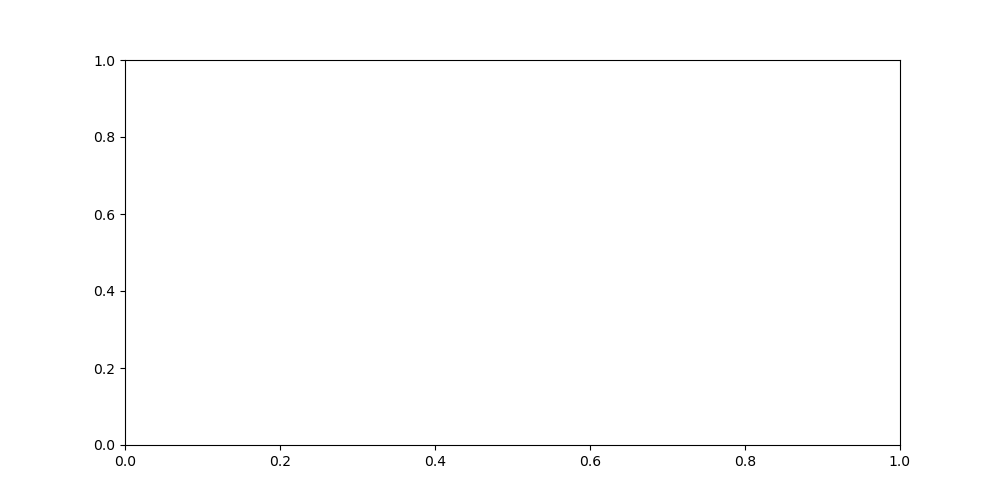

<IPython.core.display.Javascript object>


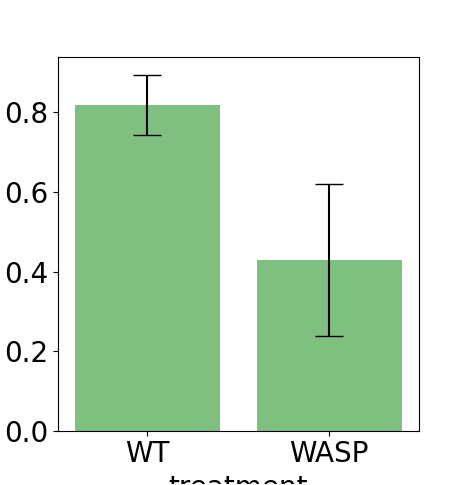

[0 1]
dict_values([0.8184369139569347, 0.4291254762897568])
dict_values([0.07585657832526134, 0.19016891694267077])
P-Value for WASP vs. WT: 0.025579591729204054


In [24]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

# Your data
values = ratio
labels = label

# Create a list of unique treatment groups
treatment_groups = np.unique([label.split("_")[0] for label in labels])

# Initialize dictionaries to store p-values for each pair of groups
p_values = {}

# Calculate p-value for each pair of groups using Student's t-test
for i in range(len(treatment_groups)):
    for j in range(i + 1, len(treatment_groups)):
        group1 = treatment_groups[i]
        group2 = treatment_groups[j]
        
        # Extract values for the two groups
        group1_values = [value for value, label in zip(values, labels) if label.startswith(group1)]
        group2_values = [value for value, label in zip(values, labels) if label.startswith(group2)]
        
        # Calculate the t-statistic and p-value using Student's t-test
        t_statistic, p_value = ttest_ind(group1_values, group2_values)
        
        # Store the p-value for this pair of groups
        p_values[(group1, group2)] = p_value


# Create your bar plot with error bars as before
x = np.arange(len(treatment_groups))
fig, ax = plt.subplots()

# Create a dictionary to store the sums and counts for each string

sums = {}

counts = {}



# Loop over the values and strings lists, updating the sums and counts in the dictionary

for value, string in zip(values, strings):

    if string not in sums:

        sums[string] = 0

        counts[string] = 0

    sums[string] += value

    counts[string] += 1



# Calculate the averages and standard errors for each string

averages = {}

errors = {}

for string in sums:

    averages[string] = sums[string] / counts[string]

    errors[string] = np.sqrt(np.var([value for value, string2 in zip(values, strings) if string2 == string]))/1  # Standard error



# Plot the bar chart with error bars

x = np.arange(len(averages))

fig, ax = plt.subplots()

ax.bar(x, averages.values(), yerr=errors.values(), align='center', alpha=0.5, ecolor='black', capsize=10,color='g')

ax.set_xticks(x)

ax.set_xticklabels(averages.keys())

ax.set_ylabel('fraction of trajectories colocalised with waves',fontsize=20, fontname='Arial')

ax.set_xlabel('treatment',fontsize=20, fontname='Arial')
plt.yticks(fontsize=20, fontname='Arial')
plt.xticks(fontsize=20, fontname='Arial')

plt.show()
print(x)
print(averages.values())
print(errors.values())

# Now, you can print or use the p-values as needed
for group1, group2 in p_values:
    p_value = p_values[(group1, group2)]
    print(f"P-Value for {group1} vs. {group2}: {p_value}")

plt.show()

In [25]:
print(ratio)
print(label)

[0.7938408896492729, 0.7140845070422536, 0.8428571428571429, 0.9229651162790697, 0.6405867970660146, 0.1794871794871795, 0.4673024523160763]
['WT', 'WT', 'WT', 'WT', 'WASP', 'WASP', 'WASP']


<IPython.core.display.Javascript object>


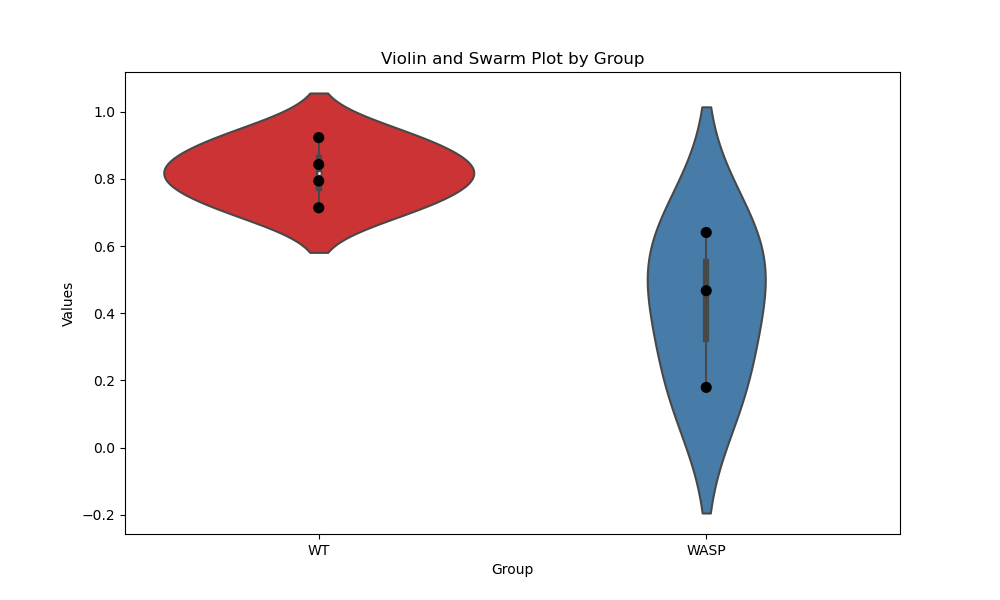

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Sample data: Replace these with your actual data
values = ratio
strings = label

# Create a DataFrame from your data
data = pd.DataFrame({'strings': strings, 'values': values})

# Create a violin plot using Seaborn
plt.figure(figsize=(10, 6))
sns.violinplot(x='strings', y='values', data=data, palette='Set1')

# Overlay a swarmplot to show individual data points
sns.swarmplot(x='strings', y='values', data=data, color='k', size=8)

plt.title('Violin and Swarm Plot by Group')
plt.xlabel('Group')
plt.ylabel('Values')

# Show the plot
plt.show()

<IPython.core.display.Javascript object>


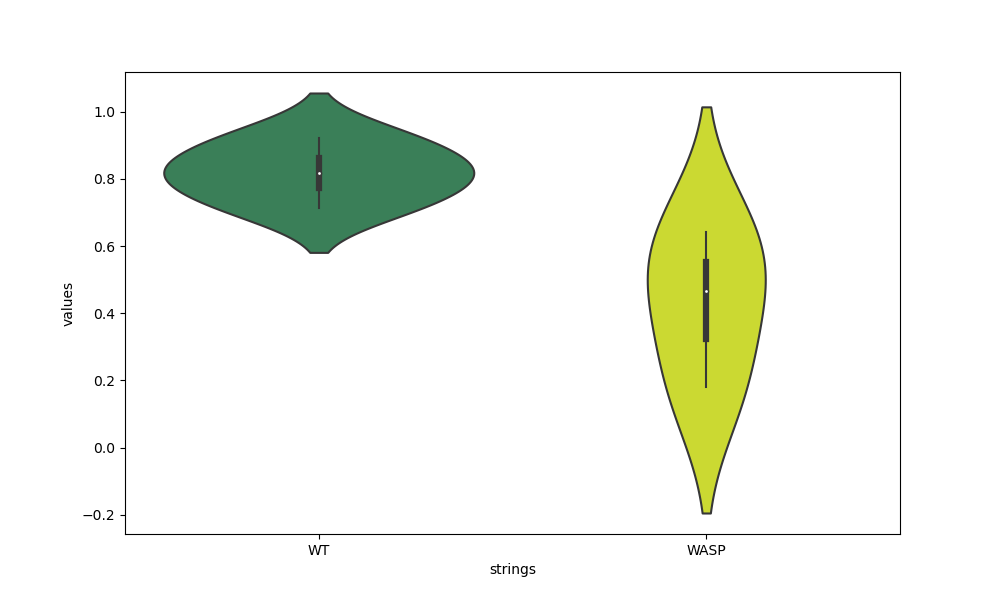

NameError: name 'custom_palette_scatter' is not defined

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.font_manager import FontProperties
# Sample data: Replace these with your actual data
values = ratio
strings = label

# Create a DataFrame from your data
data = pd.DataFrame({'strings': strings, 'values': values})

# Create a custom palette dictionary
custom_palette = {}
for l in strings:
    if l.startswith('WT'):
        custom_palette[l] = '#2E8B57'
    elif l.startswith('WASP'):
        custom_palette[l] = '#E2F516'
    else:
        custom_palette[l] = 'gray'  # Assign a default color for other labels

# Create a violin plot using Seaborn with the custom palette
plt.figure(figsize=(10, 6))
sns.violinplot(x='strings', y='values', data=data, palette=custom_palette)

# Overlay a swarmplot to show individual data points
sns.swarmplot(x='strings', y='values', data=data, palette=custom_palette_scatter,alpha=0.5,size=10)


plt.title('Violin and Swarm Plot by Group')
plt.xlabel('Group')
plt.ylabel('Values')

# Show the plot
plt.show()

<IPython.core.display.Javascript object>


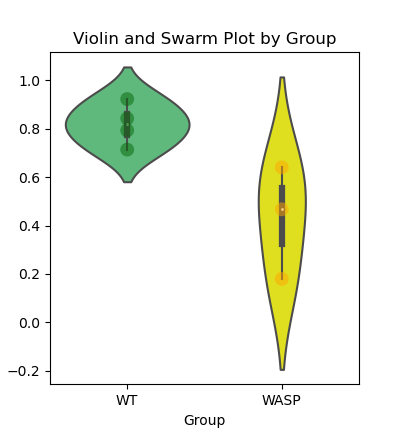

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.font_manager import FontProperties
# Sample data: Replace these with your actual data
values = ratio
strings = label

# Create a DataFrame from your data
data = pd.DataFrame({'strings': strings, 'values': values})

# Create a custom palette dictionary
custom_palette = {}
custom_palette_scatter = {}
for l in strings:
    if l.startswith('WT'):#50C878
        custom_palette[l] = '#50C878'
        custom_palette_scatter[l]='#056608'
    elif l.startswith('WASP'):
        custom_palette[l] = '#FFFF00'
        custom_palette_scatter[l]='#FFA600'
    else:
        custom_palette[l] = 'gray'  # Assign a default color for other labels

# Create a violin plot using Seaborn with the custom palette
plt.figure(figsize=(10, 6))
sns.violinplot(x='strings', y='values', data=data, palette=custom_palette)

# Overlay a swarmplot to show individual data points
sns.swarmplot(x='strings', y='values', data=data, palette=custom_palette_scatter,alpha=0.5,size=10)
# Create the plot
ax = plt.gca()

# Set legend font properties
legend_font = FontProperties(family='Arial', size=15)

plt.title('Violin and Swarm Plot by Group')
plt.xlabel('Group')
plt.ylabel('Values')

# Show the plot
plt.show()

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from scipy.stats import mannwhitneyu
# Create a dictionary to store the sums and counts for each string
values = ratio
strings = label


# Separate data into two groups (e.g., 'Jurkat' and 'Mouse')
jurkat_values = [value for value, string in zip(values, strings) if string.startswith('Jurkat')]
mouse_values = [value for value, string in zip(values, strings) if string.startswith('Mouse')]

# Calculate the Mann-Whitney U statistic and p-value
u_statistic, p_value = mannwhitneyu(jurkat_values, mouse_values, alternative='two-sided')

# Print the results
print("Mann-Whitney U Statistic:", u_statistic)
print("Two-Sided P-Value:", p_value)
# Create a dictionary to store the sums and counts for each string
sums = {}
counts = {}

# Loop over the values and strings lists, updating the sums and counts in the dictionary
for value, string in zip(values, strings):
    if string not in sums:
        sums[string] = 0
        counts[string] = 0
    sums[string] += value
    counts[string] += 1

# Calculate the averages and standard errors for each string
averages = {}
errors = {}
for string in sums:
    averages[string] = sums[string] / counts[string]
    errors[string] = np.sqrt(np.var([value for value, string2 in zip(values, strings) if string2 == string])) / 1  # Standard error

# Plot the bar chart with error bars
x = np.arange(len(averages))
fig, ax = plt.subplots()

colors = []
short_labels = []
for string in averages.keys():
    if string.startswith('Jurkat'):
        colors.append('#ff0000')
        short_labels.append(string.replace('Jurkat', ''))
    elif string.startswith('Mouse'):
        colors.append('blue')
        short_labels.append(string.replace('Mouse', ''))
    else:
        colors.append('gray')
        short_labels.append(string)

bars = ax.bar(x, averages.values(), yerr=errors.values(), align='center', alpha=0.5, ecolor='black', capsize=10, color=colors)

ax.set_xticks(x)
ax.set_xticklabels(short_labels)
ax.set_ylabel('fraction of inward moving TCR ',fontsize=20, fontname='Arial')
ax.set_xlabel('Treatment',fontsize=20, fontname='Arial')
ax.set_title('TCR direction',fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')




# Create legend handles
red_patch = plt.Line2D([0], [0], color='#ff0000', lw=5, label='Jurkat', alpha=0.5)
blue_patch = plt.Line2D([0], [0], color='blue', lw=5, label='Mice', alpha=0.5)

# Create the plot
ax = plt.gca()

# Set legend font properties
legend_font = FontProperties(family='Arial', size=12)
ax.legend(handles=[red_patch, blue_patch], fontsize=12, title_fontsize=12, prop=legend_font)

plt.show()
print(x)
print(averages.values())
print(errors.values())

ValueError: `x` and `y` must be of nonzero size.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Create a dictionary to store the sums and counts for each string
values = vel_avg
strings = label

# Create a dictionary to store the sums and counts for each string
sums = {}
counts = {}

# Loop over the values and strings lists, updating the sums and counts in the dictionary
for value, string in zip(values, strings):
    if string not in sums:
        sums[string] = 0
        counts[string] = 0
    sums[string] += value
    counts[string] += 1

# Calculate the averages and standard errors for each string
averages = {}
errors = {}
for string in sums:
    averages[string] = sums[string] / counts[string]
    errors[string] = np.sqrt(np.var([value for value, string2 in zip(values, strings) if string2 == string])) / 1  # Standard error

# Plot the bar chart with error bars
x = np.arange(len(averages))
fig, ax = plt.subplots()

colors = []
short_labels = []
for string in averages.keys():
    if string.startswith('Jurkat'):
        colors.append('red')
        #short_labels.append(string.replace('Jurkat', ''))
    elif string.startswith('Mouse'):
        colors.append('blue')
        #short_labels.append(string.replace('Mouse', ''))
    else:
        colors.append('gray')
        short_labels.append(string)

ax.bar(x, averages.values(), yerr=errors.values(), align='center', alpha=0.5, ecolor='black', capsize=10, color=colors)

ax.set_xticks(x)
ax.set_xticklabels(short_labels)
ax.set_ylabel('Velocities')
ax.set_xlabel('Cell')
ax.set_title('TCR Velocities')

plt.show()

print(x)
print(averages.values())
print(errors.values())